In [1]:
%load_ext autoreload
%autoreload 2
import os; import sys; sys.path.insert(0,'../')
import pandas as pd
import numpy as np
import tqdm
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

import atomic.features as fs
import matplotlib.pyplot as plt
import pattern.vis as vis
import sklearn.mixture as mix
import matplotsoccer as mps
import atomic.vaep as vaep
import pattern.action as pat
import atomic.atomic_spadl as ato

In [8]:
## Configure file and folder names
datafolder = "../data/private"
spadl_h5 = os.path.join(datafolder,"spadl-statsbomb.h5")
predictions_h5 = os.path.join(datafolder,"atomic-predictions-one-action.h5")

In [4]:
games = pd.read_hdf(spadl_h5,"games")
games = games[(games.competition_name == "Premier League")
             & (games.season_name == "2018/2019")]
print("nb of games:", len(games))

actiontypes = pd.read_hdf(spadl_h5, "atomic_actiontypes")
#actiontypes = pd.read_hdf(spadl_h5, "actiontypes")
bodyparts = pd.read_hdf(spadl_h5, "bodyparts")

nb of games: 380


In [9]:
with pd.HDFStore(spadl_h5) as spadlstore,\
    pd.HDFStore(predictions_h5) as predstore:
    actions = []
    for game in tqdm.tqdm(games.itertuples()):
        a = spadlstore[f"atomic_actions/game_{game.game_id}"]
        #a = spadlstore[f"atomic_actions/game_{game.game_id}"]
        p = predstore[f"game_{game.game_id}"]
        [a] = fs.play_left_to_right([a],game.home_team_id)
        a["is_home"] = a.team_id == game.home_team_id
        assert len(a) == len(p)
        a = pd.concat([a,p],axis=1)
        actions.append(a)
    actions = pd.concat(actions)
    actions = actions.merge(spadlstore["atomic_actiontypes"],how="left")
actions[:5]
actions = pd.concat([actions,vaep.value(actions,actions.scores,actions.concedes)],axis=1)

380it [00:26, 14.42it/s]


In [26]:
# Make a nice action subset
import pattern.action as pat

a = actions[350000:400000].fillna(0)
#a = actions.fillna(0)
a = pat.simplify(a)
#a["type_name"] = a.type_name.mask(~a.is_home,a.type_name + "_opp")
a["x"] = a.x.mask(a.type_name=="goal",105)
a["y"] = a.y.mask(a.type_name=="goal",34)
#a["dx"] = a.dx.mask(a.type_name=="shot",105-a.x)
#a["dy"] = a.dy.mask(a.type_name=="shot",32.5-a.y)

def fix_out_y(y):
    return 68 if 68 - y < y else 0

a["y"] = a.y.mask(a.type_name=="out",a.y.apply(fix_out_y))

import numpy as np
a["x"] = a.x + np.random.normal(0,1,len(a))
a["y"] = a.y + np.random.normal(0,1,len(a))
a["dx"] = a.dx + (a.dx != 0).apply(int) * np.random.normal(0,1,len(a))
a["dy"] = a.dy + (a.dy != 0).apply(int) * np.random.normal(0,1,len(a))

#a = pd.concat([a,fs.polar(a),fs.movement_polar(a),fs.direction(a)],axis=1)
mirror_a = a.copy()
mirror_a["y"] = 68 - mirror_a["y"]
mirror_a["dy"] = - mirror_a["dy"]
a = pd.concat([a,mirror_a],axis=0)
a = pd.concat([a,fs.polar(a),fs.movement_polar(a),fs.direction(a)],axis=1)
a = a[~(((a.type_name == "dribble") | (a.type_name == "pass")) & (a.mov_d_a0 < 5))]

In [11]:
len(a)

69184

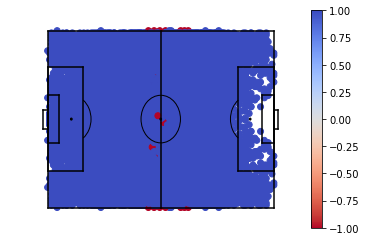

102


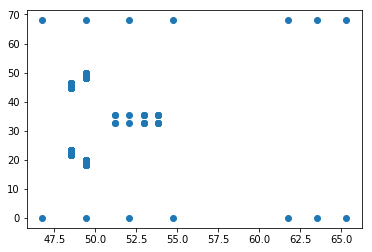

28552


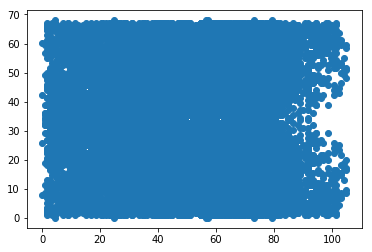

In [106]:
from sklearn.ensemble import IsolationForest as IF
from sklearn.neighbors import LocalOutlierFactor as LOF

s = a[a.type_name == "pass"]
#print(s.x.value_counts())
mps.field(show=False)

#model = IF(contamination=0.001).fit(s[["x","y"]])
# c = model.decision_function(s[["x","y"]])
#c = model.predict(s[["x","y"]])

c = LOF(contamination="auto").fit_predict(s[["x","y"]])
#c = lof.decision_function(s[["x","y"]])

plt.scatter(s.x,s.y,c=c,cmap="coolwarm_r")
plt.colorbar()
plt.show()
for i in [-1,1]:
    print(sum(c==i))
    #mps.field(show=False)
    plt.scatter(s.x[c==i],s.y[c==i])
    plt.show()

In [12]:
import sklearn
import sklearn.mixture as mix
from sklearn.mixture._gaussian_mixture import (
    _estimate_gaussian_parameters,
    _compute_precision_cholesky,
    )
import numpy as np
import numpy.linalg as linalg

import sklearn.cluster as cluster

class WeightedGMM(mix.GaussianMixture):
    
    def fit(self,X,weights=None,*k,**kw):
        if weights is None:
            weights = np.zeros(len(X)) + 1
        pos_weight_idx = weights > 1e-10
        self.Xweights = weights[pos_weight_idx]
        return super().fit(X[pos_weight_idx],*k,**kw)
        
    def _m_step(self, X, log_resp):
            """M step.
            Parameters
            ----------
            X : array-like, shape (n_samples, n_features)
            log_resp : array-like, shape (n_samples, n_components)
                Logarithm of the posterior probabilities (or responsibilities) of
                the point of each sample in X.
            """
            resp = (self.Xweights*np.exp(log_resp).T).T
            self.weights_, self.means_, self.covariances_ = (
                _estimate_gaussian_parameters(X,resp, self.reg_covar,
                                              self.covariance_type))
            
            self.weights_ /= np.sum(self.Xweights)
#             for i in range(len(self.covariances_)):
#                 [[a,b],[c,d]] = self.covariances_[i]
#                 if min(a,d) < 5:
#                     self.covariances_[i] *= 5/min(a,d)
#                 self.covariances_[i] = np.array([[a,b],[c,d]])
                
            self.precisions_cholesky_ = _compute_precision_cholesky(
                self.covariances_, self.covariance_type)
            
    def _initialize_parameters(self, X, random_state):
            """Initialize the model parameters.
            Parameters
            ----------
            X : array-like, shape  (n_samples, n_features)
            random_state : RandomState
                A random number generator instance.
            """
            n_samples, _ = X.shape

            if self.init_params == 'kmeans':
                resp = np.zeros((n_samples, self.n_components))
                clus = cluster.KMeans(n_clusters=self.n_components, n_init=20,
                                       random_state=random_state)
                label = clus.fit(X,sample_weight=self.Xweights).labels_
                resp[np.arange(n_samples), label] = 1
            elif self.init_params == 'random':
                resp = random_state.rand(n_samples, self.n_components)
                resp /= resp.sum(axis=1)[:, np.newaxis]
            else:
                raise ValueError("Unimplemented initialization method '%s'"
                                 % self.init_params)

            self._initialize(X, resp)
            
    def score_samples(self,X,weights=None):
        if weights is None:
            weights = np.zeros(len(X)) + 1
        pos_weights_idx = weights > 1e-10
        
        scores = np.zeros(len(X))
        pos_weights = weights[pos_weights_idx]
        pos_scores = super().score_samples(X[pos_weights_idx])
        scores[pos_weights_idx] = (pos_weights*pos_scores.T).T
        return scores
    
    def predict_proba(self,X,weights=None):
        if weights is None:
            weights = np.zeros(len(X)) + 1
        pos_weights_idx = weights > 1e-10
        
        p = np.zeros((len(X),self.n_components))
        pos_weights = weights[pos_weights_idx]
        pos_probs = super().predict_proba(X[pos_weights_idx])
        p[pos_weights_idx,:] = (pos_weights*pos_probs.T).T
        return p

def candidates(df,columns,weightsdf,n=5,verbose=True):
    candidates = []
    for name in weightsdf.columns:
        weights = weightsdf[name].values
        n_components = range(1,min(n+1,int(sum(weights))))
        if verbose:
            n_components = tqdm.tqdm(n_components,desc=name)
        for i in n_components:
            try:
                model = WeightedGMM(n_components=i,
                                    covariance_type='full',
                                    n_init = 1).fit(df[columns].values,weights)
                model.name = name
                #model.loglikelihood = model.score_samples(X,weights).sum()
                model.df=df
                model.columns = columns
                model.weights = weights
                model.likelihood = model.score_samples(
                    df[columns],weights
                ).sum()
                candidates.append(model)
            except sklearn.exceptions.ConvergenceWarning:
                break
    return candidates

# def scores(models,verbose=True):
#     if verbose:
#         models = tqdm.tqdm(models)
#     return list((model.name,
#                  model.n_components,
#                  model.score_samples(model.df[model.columns],
#                                      model.weights).sum())
#                 for model in models)

def probabilities(models):
    weights = []
    for model in models:
        probs = model.predict_proba(model.df[model.columns].values,model.weights)
        columns = list(f"{model.name}_{i}" for i in range(model.n_components))
        weights.append(pd.DataFrame(probs,columns=columns))
    return pd.concat(weights,axis=1)

In [39]:
%%time
import warnings
warnings.filterwarnings("error")
from sklearn.neighbors import LocalOutlierFactor as LOF

cols = ["x","y",
        #"dx","dy"
        #"dist_to_goal_a0",
        #"angle_to_goal_a0",
        #"mov_d_a0",
        "mov_angle_a0"
        #"dx_a0",
        #"dy_a0"
       ]

w = pd.DataFrame()
#for t in ["dribble","pass","shot","cross"]:
for t in set(a.type_name):
#for t in ["keeper_catch","cross","goal","goalkick","throw_in","out"]:
    t_idx = (a.type_name == t)
    if sum(t_idx) > 20:
        c = LOF(contamination="auto").fit_predict(a[t_idx][["x","y"]])#,"mov_angle_a0"]])
        t_idx[t_idx] = c==1
        print(f"removed {sum(c==-1)} {t} examples, {sum(t_idx)} examples remaining")
        w[t] = t_idx.apply(float)
        #w[t] = w[t] * (a.scores + a.concedes)
        #print(t,sum(w[t]))

def candidates(df,columns,weightsdf,rangedict=None,n=5,verbose=True):
    candidates = []
    for name in weightsdf.columns:
        weights = weightsdf[name].values
        if rangedict:
            n_components = rangedict[name]
        else:
            n_components = range(1,min(n+1,int(sum(weights))))
            
        if verbose:
            n_components = tqdm.tqdm(n_components,desc=name)
        for i in n_components:
            try:
                model = WeightedGMM(n_components=i,
                                    covariance_type='full',
                                    n_init = 1).fit(df[columns].values,weights)
                model.name = name
                #model.loglikelihood = model.score_samples(X,weights).sum()
                model.df=df
                model.columns = columns
                model.weights = weights
                model.likelihood = model.score_samples(
                    df[columns],weights
                ).sum()
                candidates.append(model)
            except sklearn.exceptions.ConvergenceWarning:
                break
    return candidates

rangedict = {name : range(1,10) for name in w.columns}
rangedict["pass"] = range(20,50)
rangedict["dribble"] = range(10,30)
rangedict["receival"] = range(10,30)

can_i = candidates(a,cols,w,rangedict=rangedict)

removed 0 tackle examples, 1232 examples remaining
removed 0 cross examples, 678 examples remaining
removed 10 throw_in examples, 1366 examples remaining
removed 6 offside examples, 112 examples remaining
removed 26 receival examples, 25452 examples remaining
removed 18 out examples, 1258 examples remaining
removed 0 take_on examples, 1122 examples remaining
removed 2 bad_touch examples, 770 examples remaining
removed 12 shot examples, 774 examples remaining
removed 34 clearance examples, 1672 examples remaining
removed 4 goal examples, 92 examples remaining
removed 32 corner examples, 282 examples remaining
removed 30 keeper_catch examples, 264 examples remaining
removed 0 foul examples, 830 examples remaining
removed 14 goalkick examples, 452 examples remaining
removed 26 interception examples, 6508 examples remaining
removed 14 dribble examples, 10892 examples remaining


tackle:   0%|          | 0/9 [00:00<?, ?it/s]

removed 30 pass examples, 26342 examples remaining
removed 4 freekick examples, 804 examples remaining
removed 2 yellow_card examples, 102 examples remaining


yellow_card: 100%|██████████| 9/9 [00:00<00:00, 10.46it/s]

CPU times: user 21min 4s, sys: 10min 57s, total: 32min 2s
Wall time: 10min 30s


In [47]:
models_i = pat.ilp_select_models_bic(can_i,verbose=True)
models_all = {m.name : m.n_components for m in models_i}
models_i = pat.select_models_solo_bic(can_i)
models_solo = {m.name : m.n_components for m in models_i}
list((m.name,models_all[m.name], models_solo[m.name]) for m in models_i)

Iter	Lower Bound	Upper Bound	Gap

ECOS 2.0.7 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.089e+06  +2.946e+05  +8e+05  7e-03  1e-10  1e+00  2e+03    ---    ---    1  1  - |  -  - 
 1  +1.085e+06  +9.092e+05  +2e+05  1e-03  3e-11  4e+00  4e+02  0.7768  3e-03   0  1  1 |  0  0
 2  +1.086e+06  +9.608e+05  +1e+05  1e-03  2e-11  1e+02  3e+02  0.6398  5e-01   0  2  1 |  0  0
 3  +1.084e+06  +1.049e+06  +4e+04  2e-04  5e-12  4e+01  8e+01  0.7396  2e-02   0  1  2 |  0  0
 4  +1.083e+06  +1.056e+06  +3e+04  2e-04  4e-12  4e+01  6e+01  0.4757  5e-01   0  2  2 |  0  0
 5  +1.081e+06  +1.075e+06  +6e+03  3e-05  9e-13  1e+01  1e+01  0.8427  8e-02   0  2  1 |  0  0
 6  +1.079e+06  +1.078e+06  +1e+03  6e-06  2e-13  3e+00  3e+00  0.9760  2e-01   0  1  1 |  0  0
 7  +1.079e+06  +1.078e+06  +2e+02  8e-07  3e-14  4e-01  5e-01  0.8616  1e-02   0  1  1 |  0  0
 8  +1.079e+0

[('tackle', 5, 6),
 ('cross', 4, 4),
 ('throw_in', 8, 8),
 ('offside', 1, 1),
 ('receival', 15, 15),
 ('out', 4, 4),
 ('take_on', 5, 5),
 ('bad_touch', 3, 3),
 ('shot', 3, 3),
 ('goal', 1, 1),
 ('clearance', 3, 3),
 ('corner', 4, 4),
 ('keeper_catch', 1, 1),
 ('foul', 1, 3),
 ('goalkick', 1, 1),
 ('interception', 8, 8),
 ('dribble', 10, 13),
 ('pass', 21, 21),
 ('freekick', 5, 6),
 ('yellow_card', 1, 1)]

In [44]:
models_i = pat.ilp_select_models_aic(can_i,verbose=True)
list((m.name,m.n_components) for m in models_i)

Iter	Lower Bound	Upper Bound	Gap

ECOS 2.0.7 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.074e+06  +2.385e+05  +9e+05  7e-03  1e-10  1e+00  2e+03    ---    ---    1  1  - |  -  - 
 1  +1.071e+06  +9.640e+05  +1e+05  7e-04  1e-11  6e+00  2e+02  0.8732  3e-03   0  1  1 |  0  0
 2  +1.069e+06  +1.034e+06  +4e+04  2e-04  5e-12  8e+01  8e+01  0.9890  3e-01   0  2  1 |  0  0
 3  +1.068e+06  +1.063e+06  +6e+03  3e-05  8e-13  1e+01  1e+01  0.8491  4e-03   0  1  1 |  0  0
 4  +1.068e+06  +1.064e+06  +4e+03  2e-05  5e-13  8e+00  8e+00  0.6226  4e-01   0  2  1 |  0  0
 5  +1.067e+06  +1.066e+06  +9e+02  4e-06  1e-13  2e+00  2e+00  0.8112  6e-02   0  1  1 |  0  0
 6  +1.067e+06  +1.067e+06  +3e+02  1e-06  6e-14  7e-01  7e-01  0.9090  3e-01   0  1  1 |  0  0
 7  +1.067e+06  +1.067e+06  +3e+01  2e-07  2e-14  7e-02  8e-02  0.9327  4e-02   0  1  1 |  0  0
 8  +1.067e+0

[('tackle', 9),
 ('cross', 6),
 ('throw_in', 8),
 ('offside', 5),
 ('receival', 15),
 ('out', 9),
 ('take_on', 9),
 ('bad_touch', 7),
 ('shot', 8),
 ('clearance', 9),
 ('goal', 1),
 ('corner', 8),
 ('keeper_catch', 1),
 ('foul', 8),
 ('goalkick', 4),
 ('interception', 8),
 ('dribble', 29),
 ('pass', 49),
 ('freekick', 7),
 ('yellow_card', 1)]

In [48]:
w_i = probabilities(models_i)

tackle 6


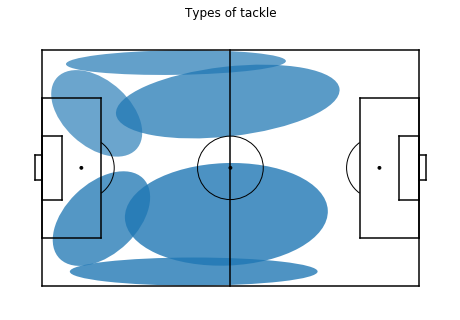

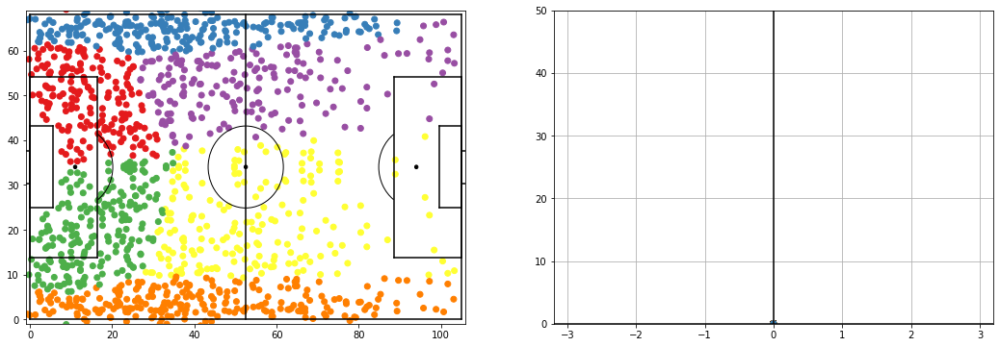

cross 4


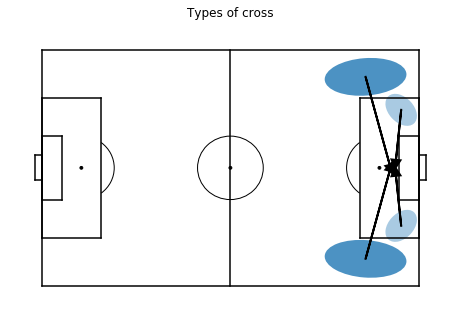

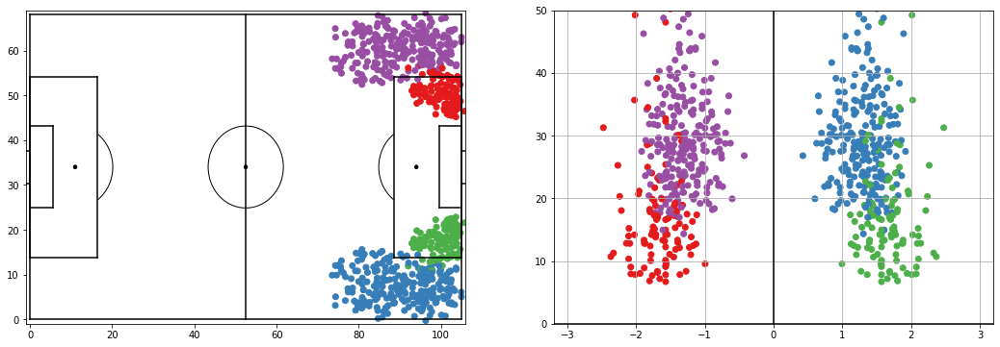

throw_in 8


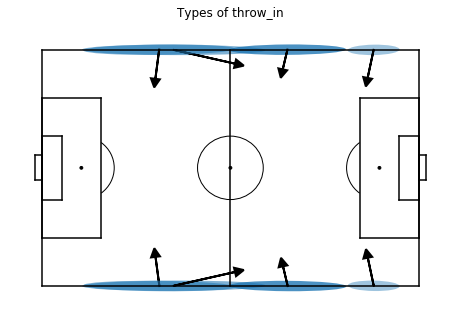

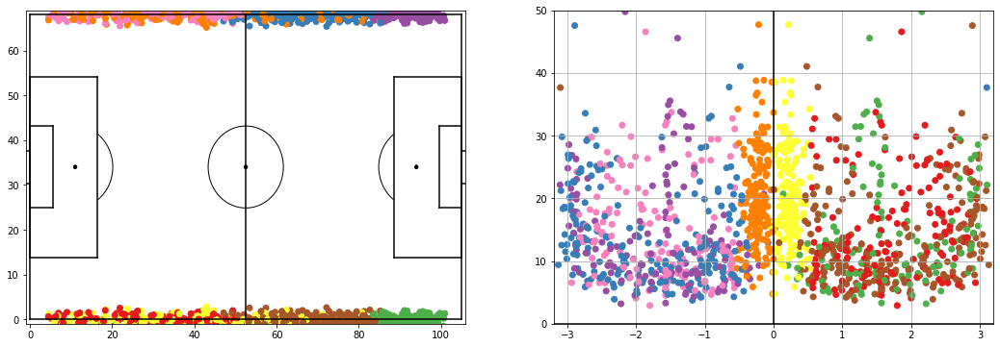

offside 1


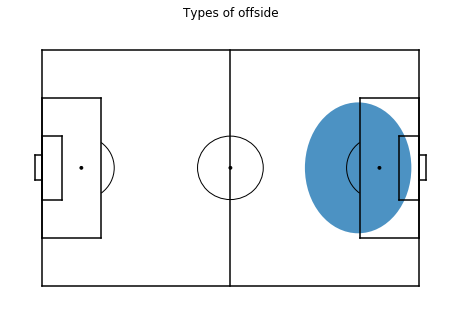

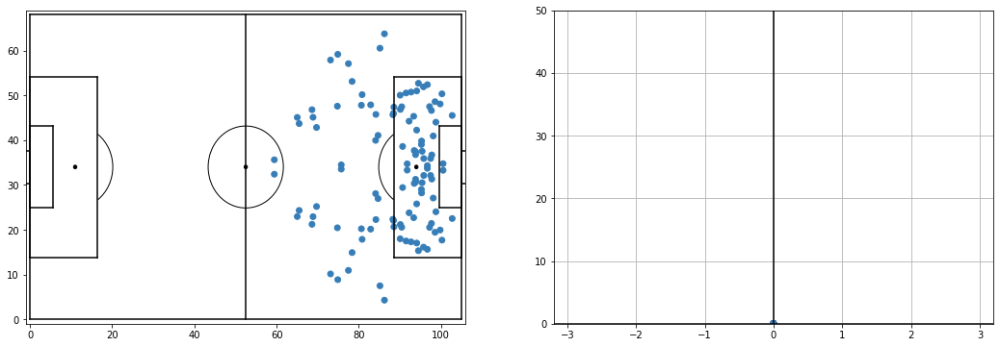

receival 15


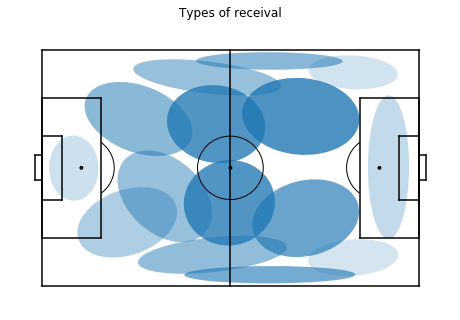

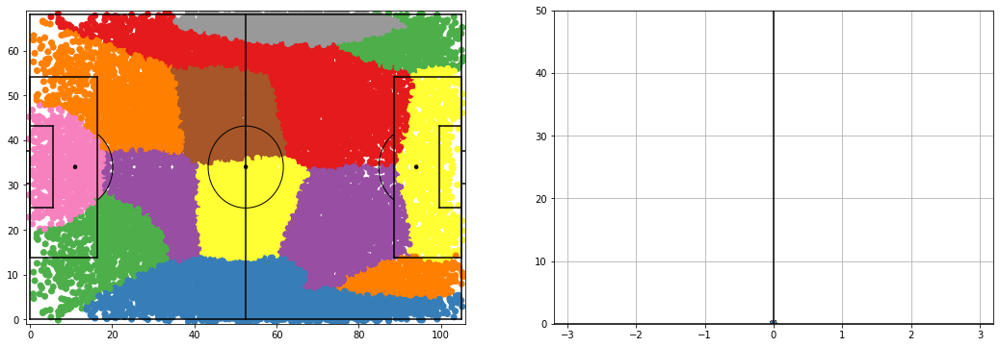

out 4


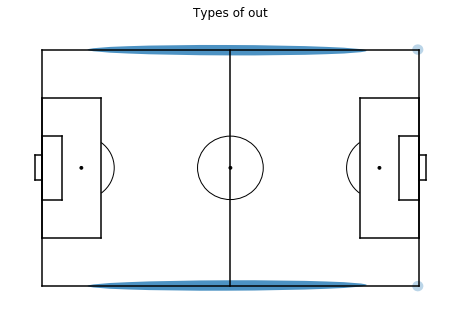

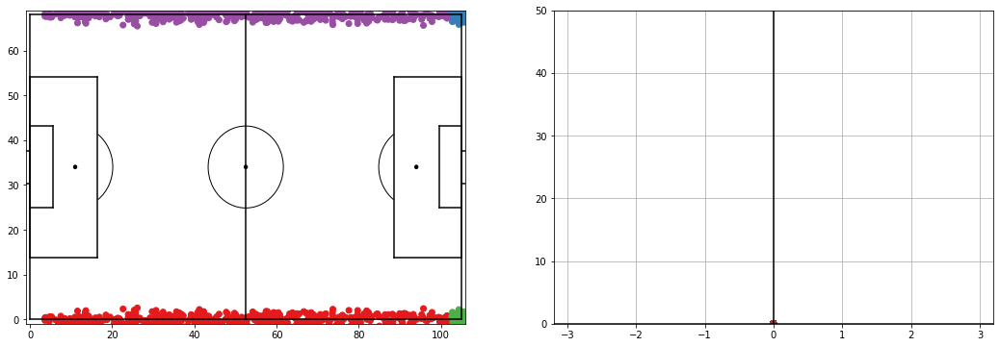

take_on 5


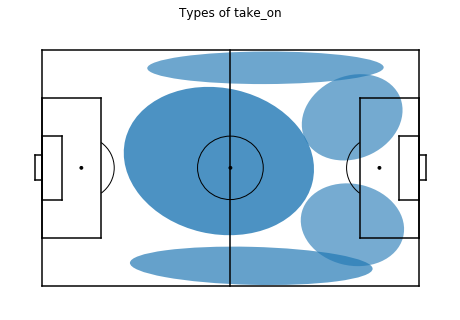

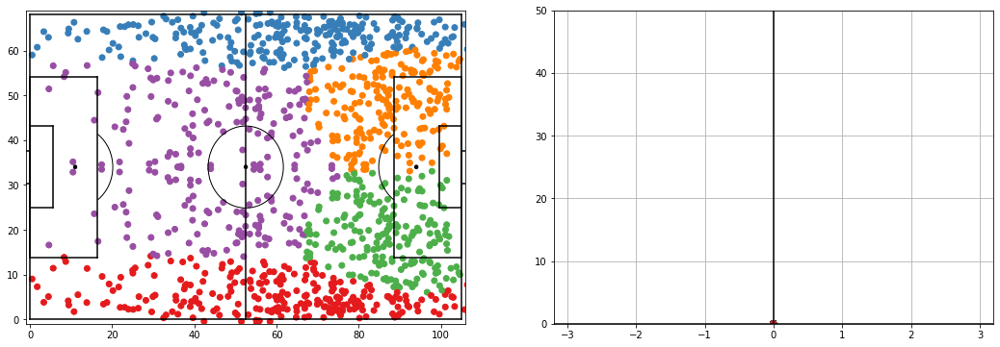

bad_touch 3


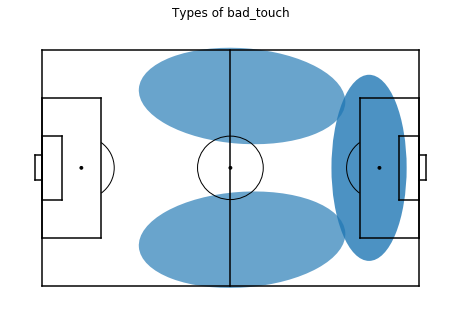

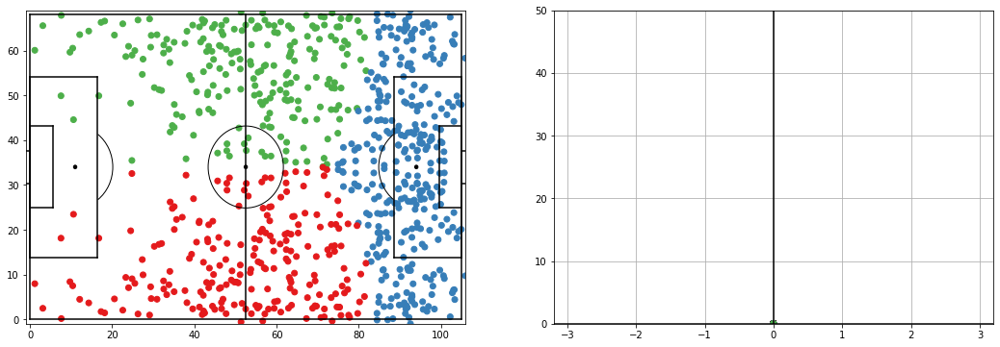

shot 3


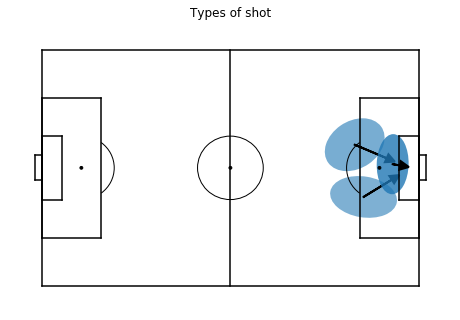

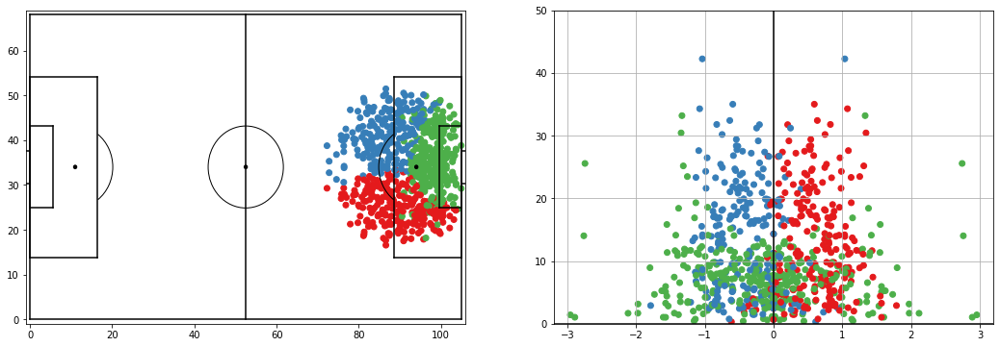

goal 1


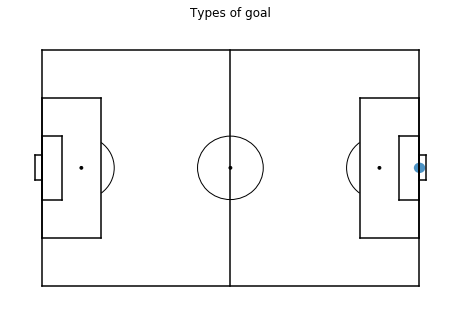

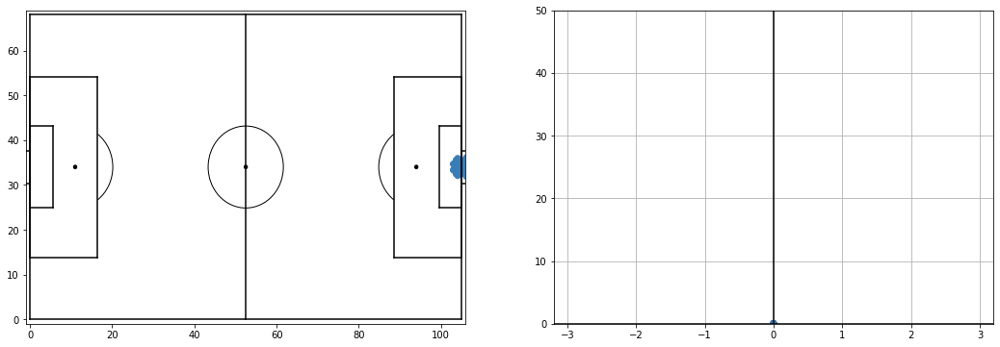

clearance 3


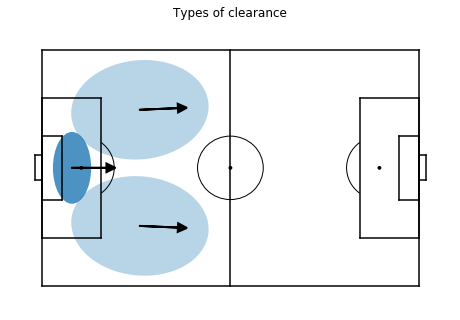

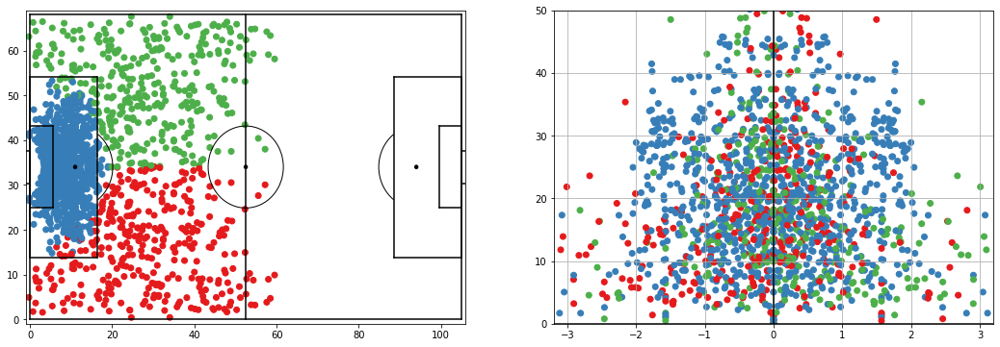

corner 4


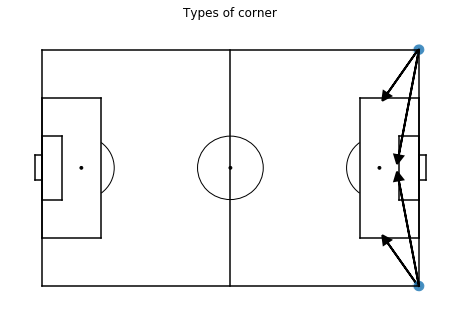

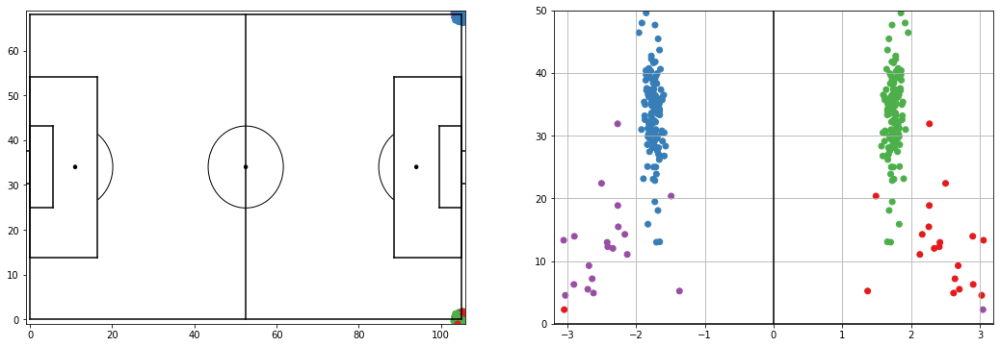

keeper_catch 1


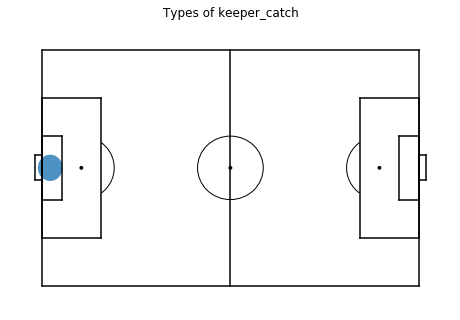

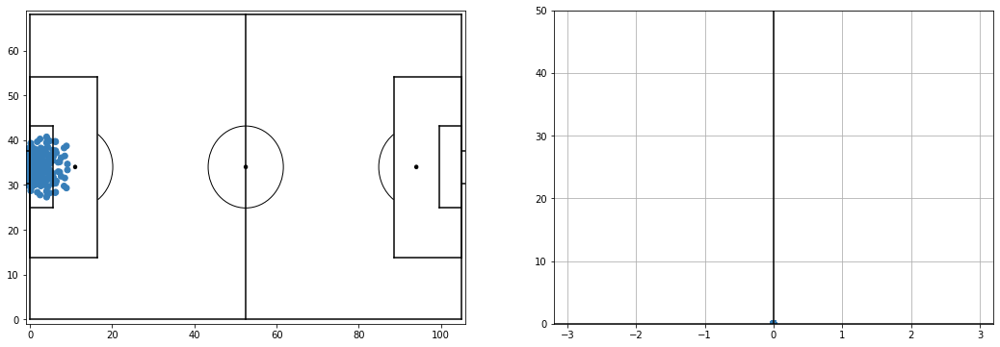

foul 3


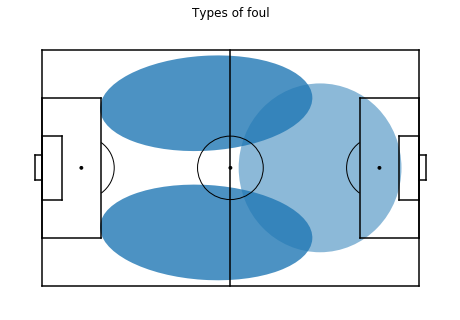

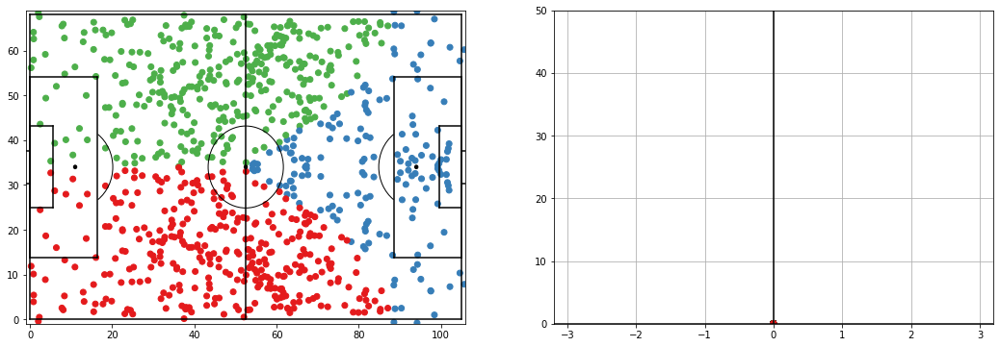

goalkick 1


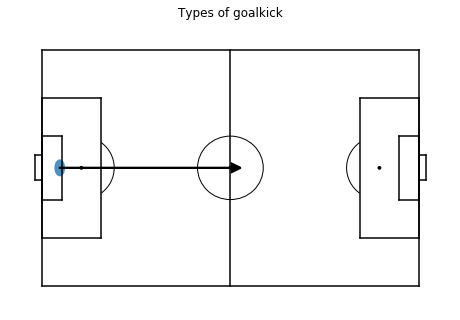

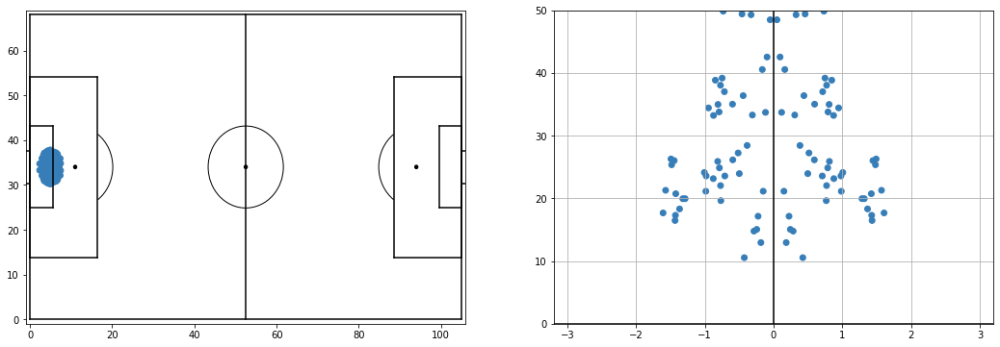

interception 8


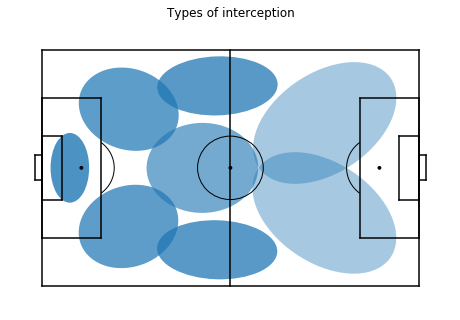

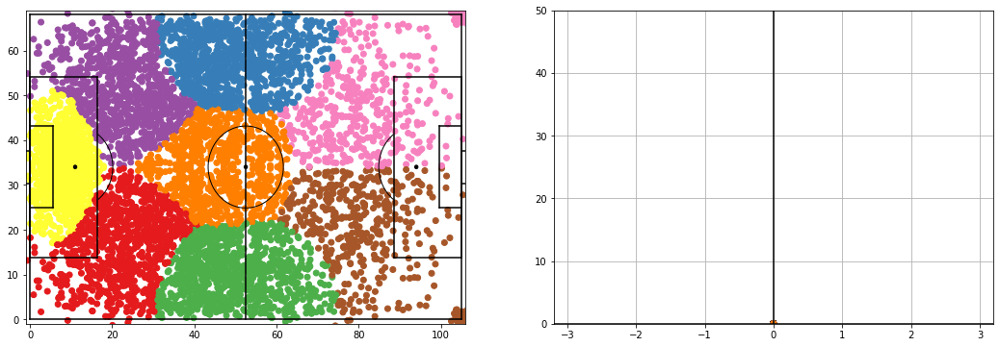

dribble 13


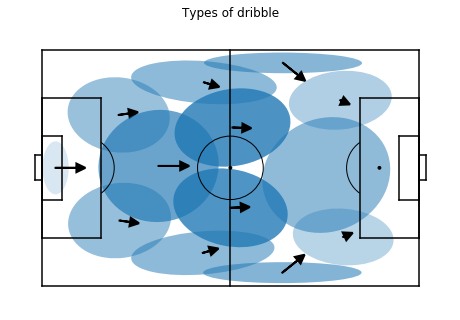

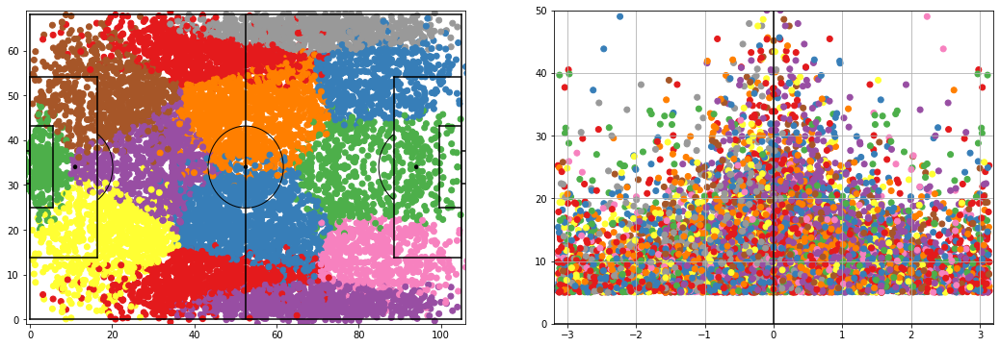

pass 21


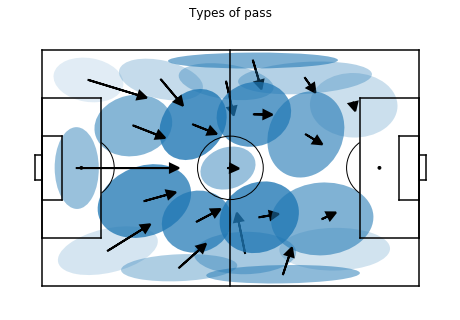

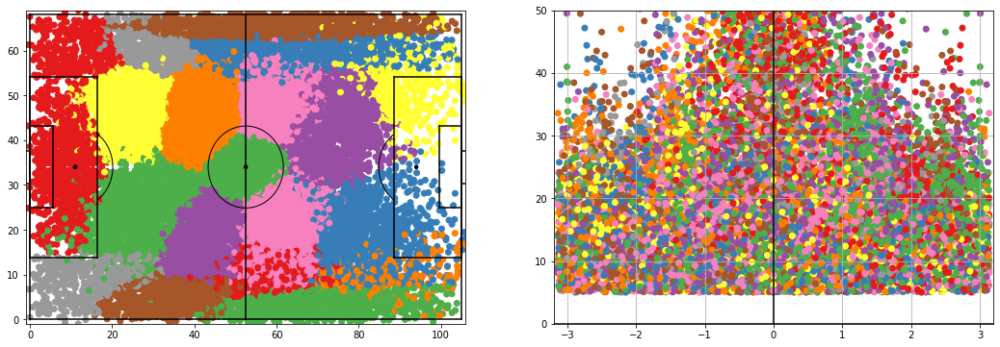

freekick 6


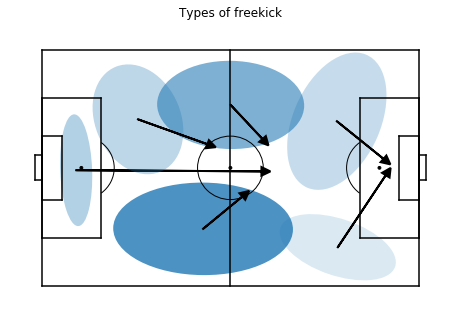

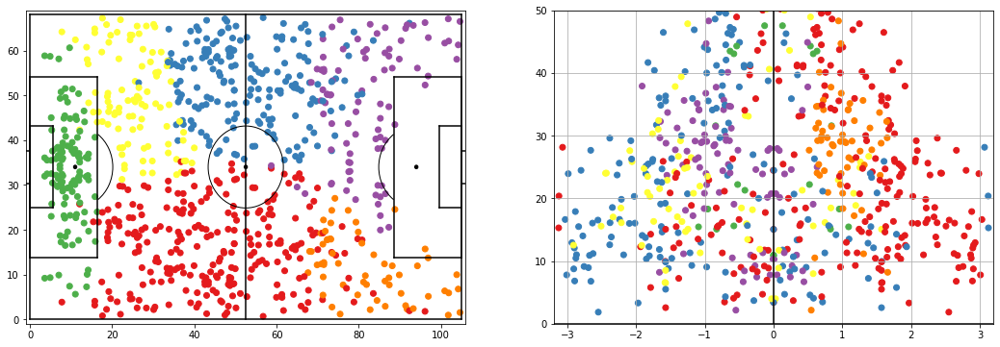

yellow_card 1


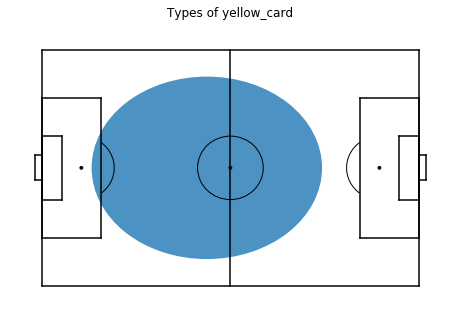

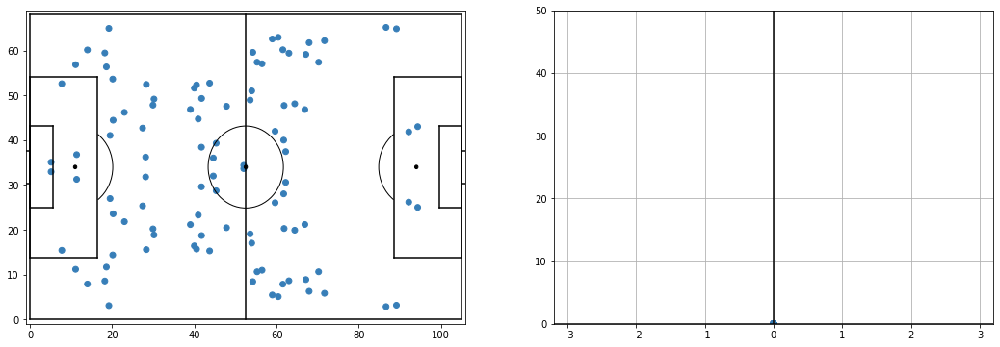

In [49]:
import warnings
warnings.filterwarnings("ignore")

colors = ["#377eb8",
    "#e41a1c",
    "#4daf4a",
    "#984ea3",
    "#ff7f00",
    "#ffff33",
    "#a65628",
    "#f781bf",
    "#999999",
    ]

def scattercolors(actions,weights,samplefn="max"):
    pos_weights_idx = weights.values.sum(axis=1) > 1e-8
    a = actions[pos_weights_idx]
    weights = weights[pos_weights_idx]

    if samplefn == "max":
        labels = np.argmax(weights.values,axis=1)
    else:
        labels = np.apply_along_axis(sample,axis=1, arr=weights.values)

    pcolors = [colors[l % len(colors)] for l in labels]
    return a,pcolors


for m_i in models_i:
    ax = mps.field(show=False,figsize=8)
    print(m_i.name,m_i.n_components)
    strengths_i = m_i.weights_ / np.max(m_i.weights_) * 0.8
    for i,(mean,covar,strength_i) in enumerate(zip(m_i.means_, m_i.covariances_,strengths_i)):
        #print(mean,covar)
        vis.add_ellips(ax,mean[:2],covar[:2,:2],alpha=strength_i)
        #vis.add_ellips(ax,mean[:2],[[covar[0],0],[0,covar[1]]],alpha=strength_i)
        x,y = mean[:2]
        we = w_i[f"{m_i.name}_{i}"].values
        dx = np.average(m_i.df["dx"].values,weights=we)
        dy = np.average(m_i.df["dy"].values,weights=we)
        d = 1
        strength_ii=1
        vis.add_arrow(ax,x,y,d*dx,d*dy,
                                  alpha=strength_ii,
                                  linewidth=2*strength_ii,
                                  arrowsize=2.5*strength_ii,
                                  #linewidth=2,
                                  threshold=1)
    plt.title(f"Types of {m_i.name}")
    plt.show()
    
    columns = list(f"{m_i.name}_{i}" for i in range(m_i.n_components))
    acol,c = scattercolors(a,w_i[columns])
    
    axs = vis.axesxypolar()
    axs[0].scatter(acol.x,acol.y,c=c)
    axs[1].scatter(acol.mov_angle_a0,acol.mov_d_a0,c=c)
    #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    #axs[1].scatter(dfc.mov_angle_a0,dfc.mov_d_a0,c=dfc.membership,cmap="Blues")
    plt.show()

pass_0 11729 916.0668737054718


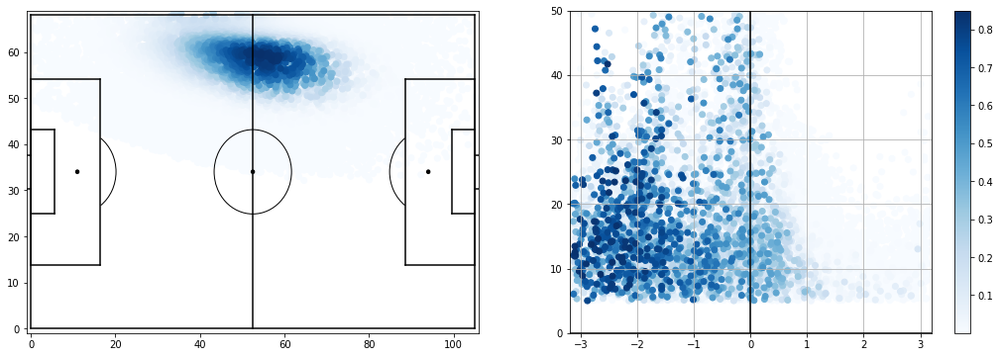

pass_1 13341 1041.154898231199


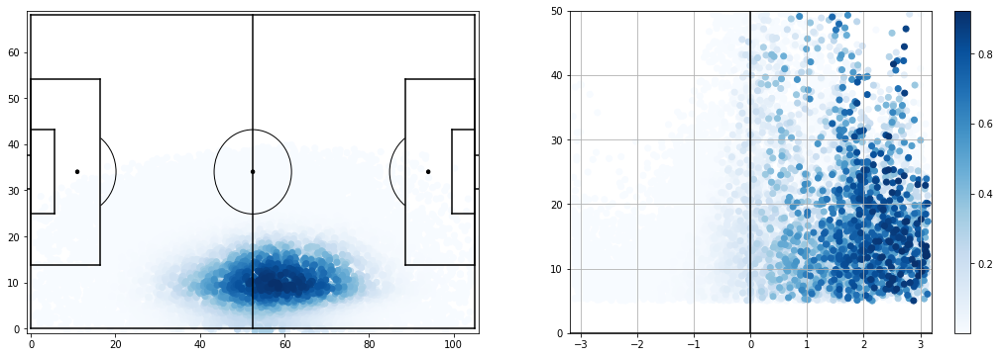

pass_2 24621 2031.1229870873549


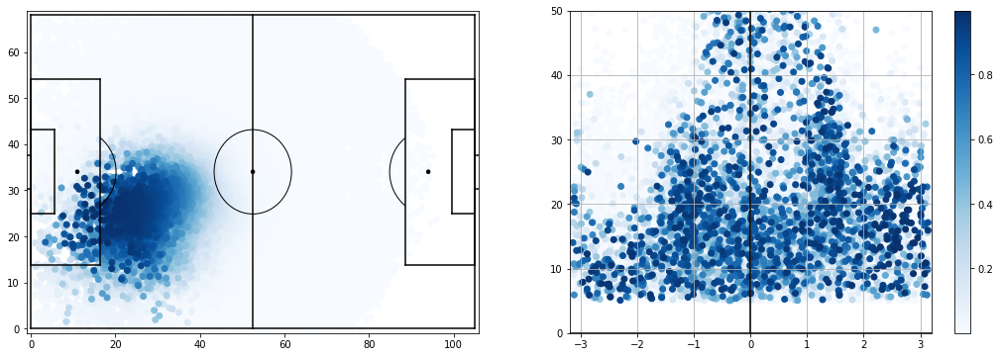

pass_3 22647 1604.2487586543637


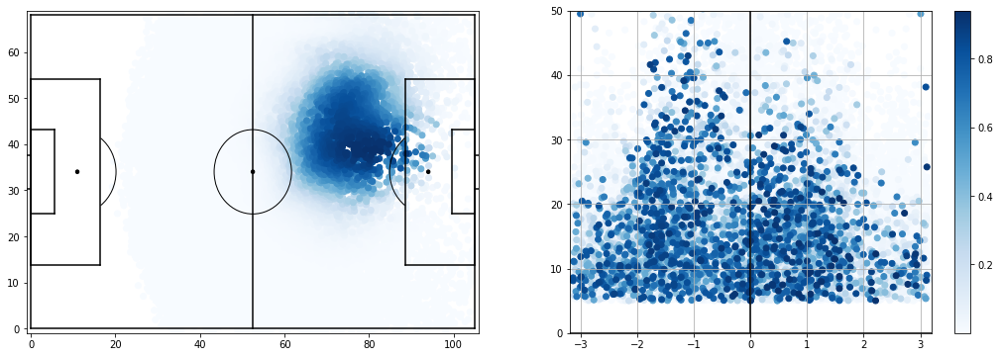

pass_4 22526 2118.080978979957


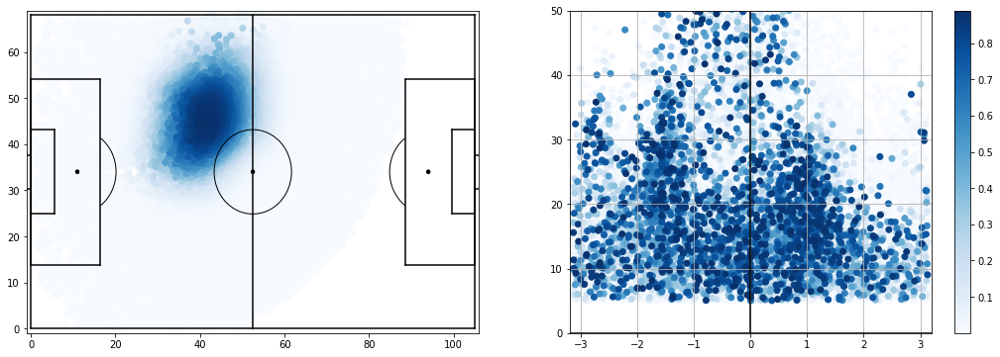

pass_5 18612 1425.1950479476047


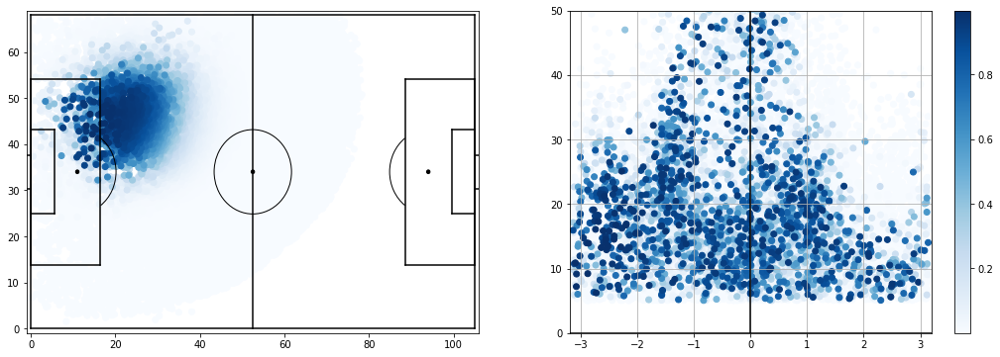

pass_6 5475 1575.8009838225157


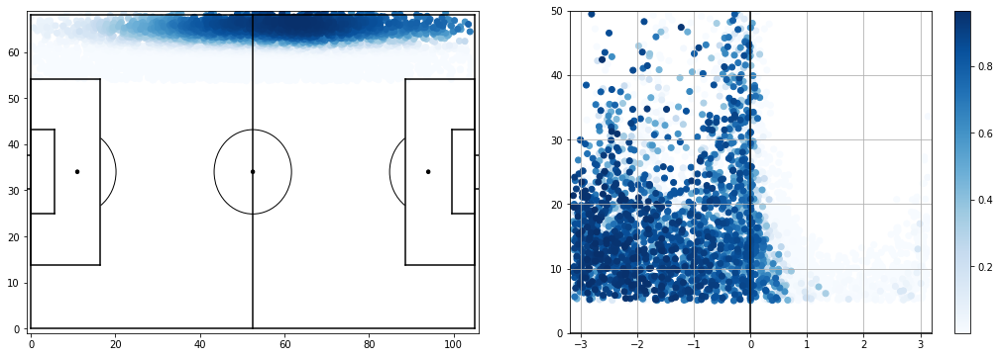

pass_7 22715 2081.9048164659775


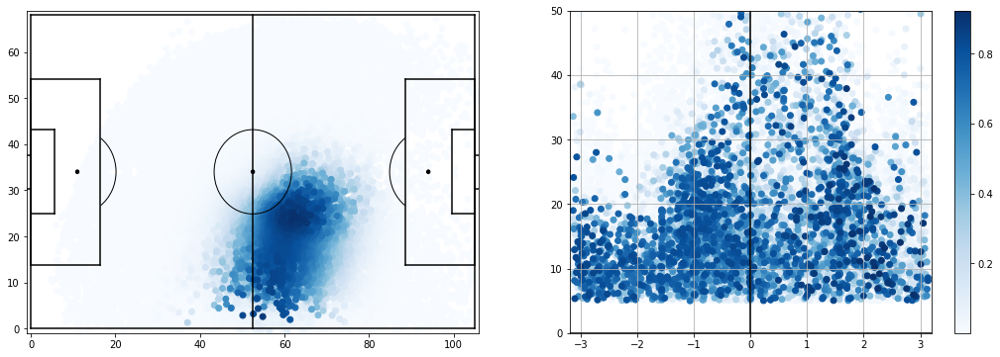

pass_8 12726 486.06111143257056


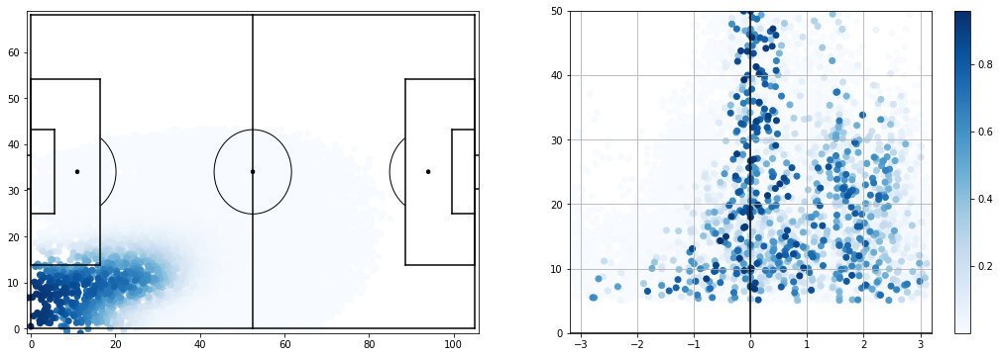

pass_9 11250 873.3991655458126


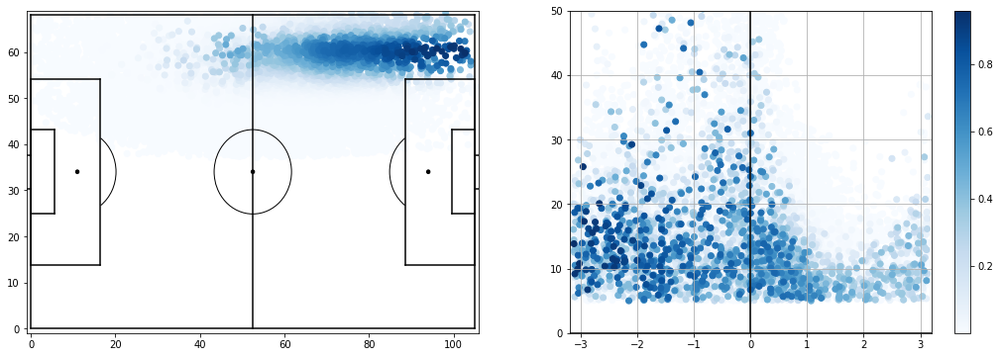

pass_10 6866 1202.5121761400032


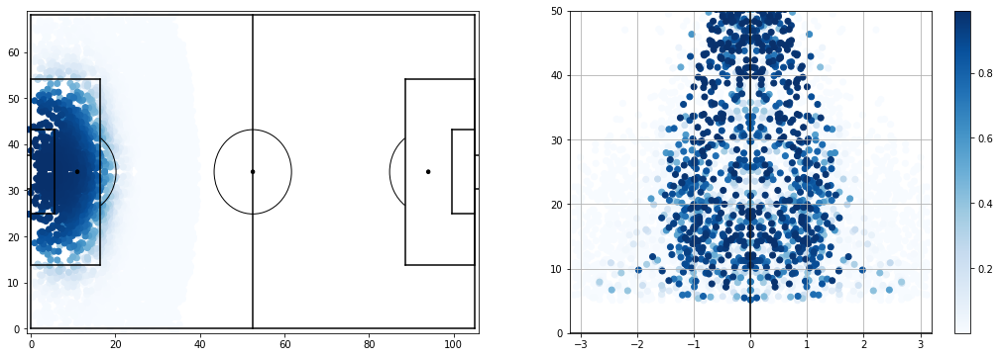

pass_11 17349 1212.9438976011036


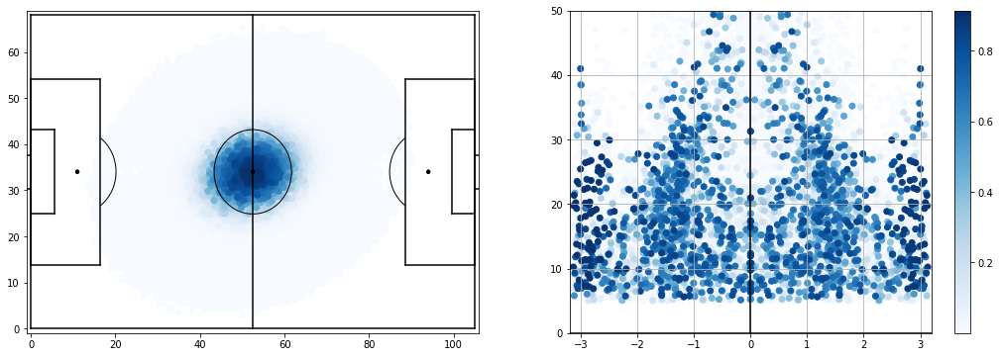

pass_12 21402 1912.9124237389203


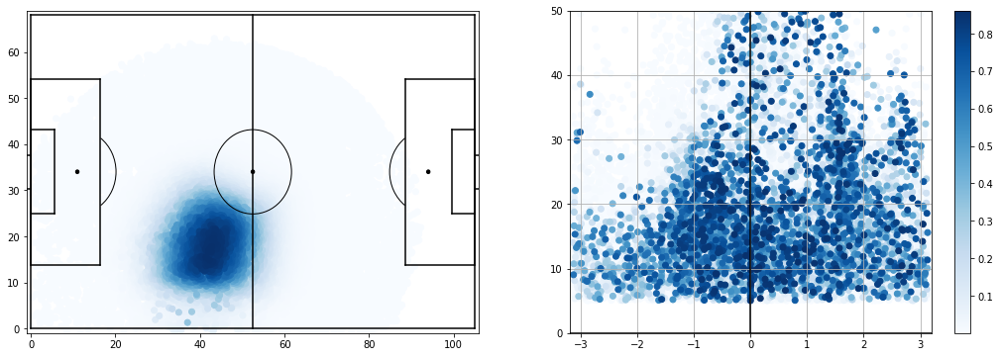

pass_13 12735 539.490105969663


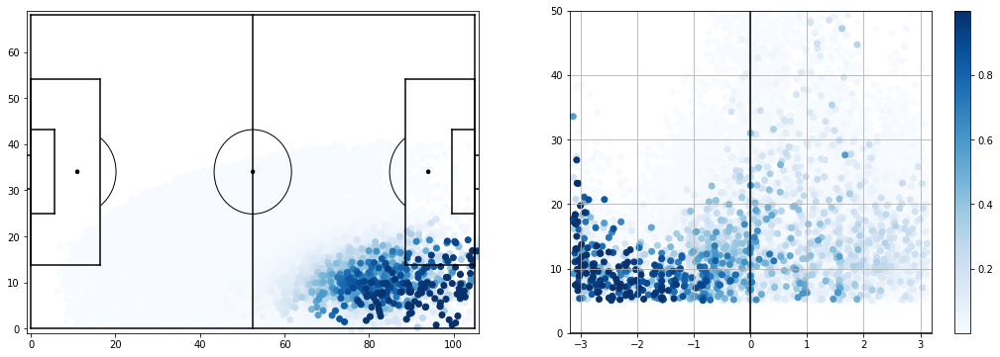

pass_14 14119 614.0447391643463


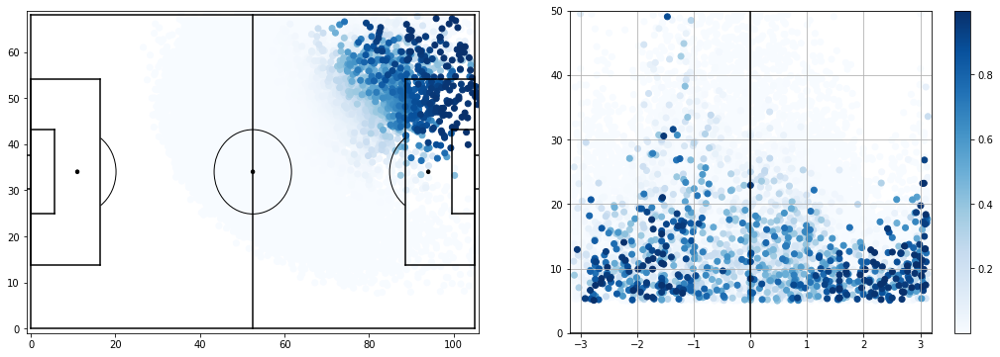

pass_15 9129 948.6107049912358


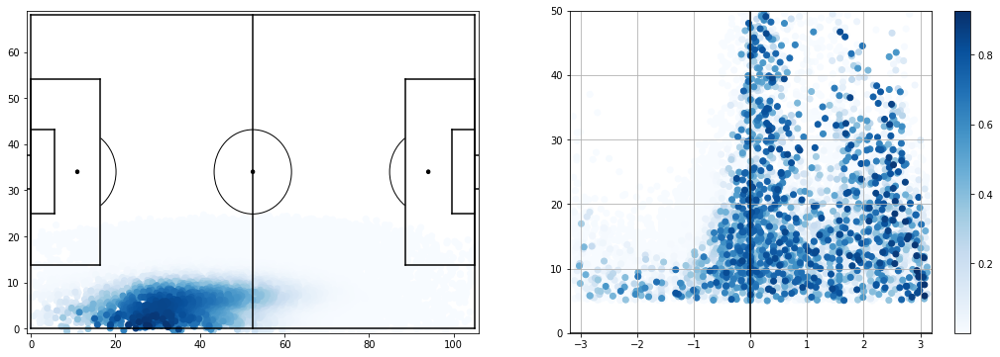

pass_16 21787 1898.3663011234146


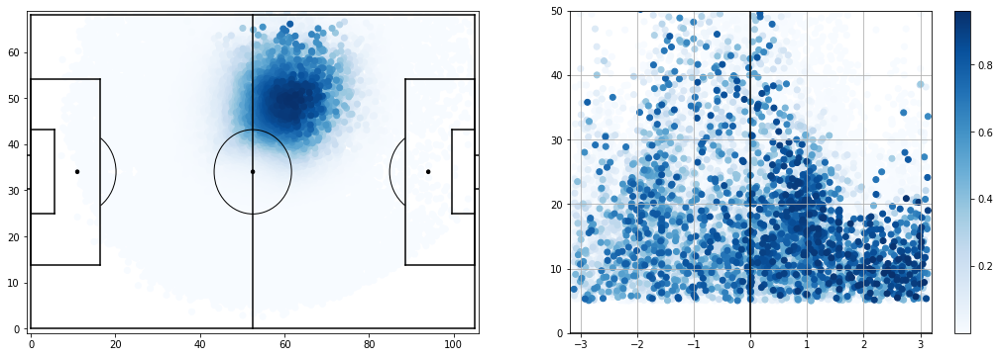

pass_17 12658 669.910523364261


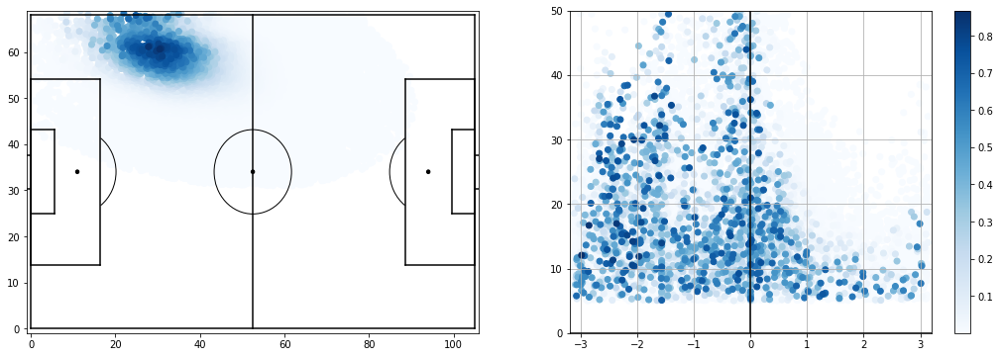

pass_18 21133 1493.058063696335


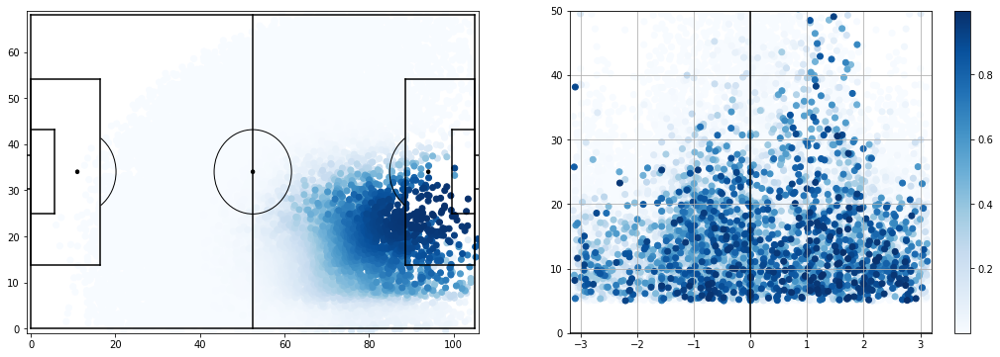

pass_19 7805 347.1689380153127


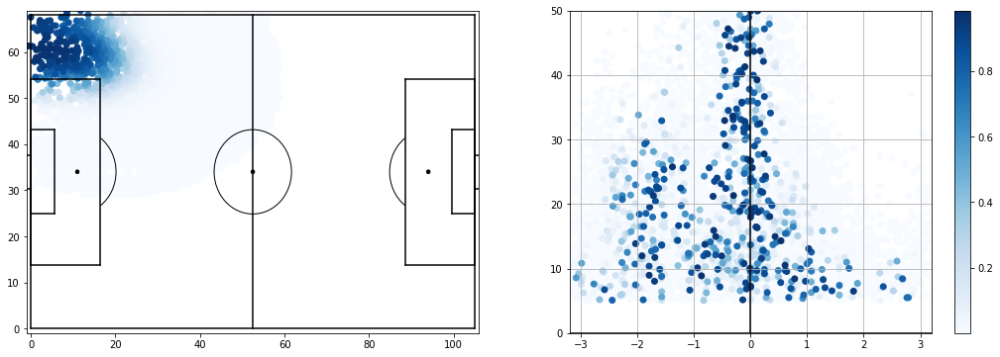

pass_20 6057 1349.9465043224548


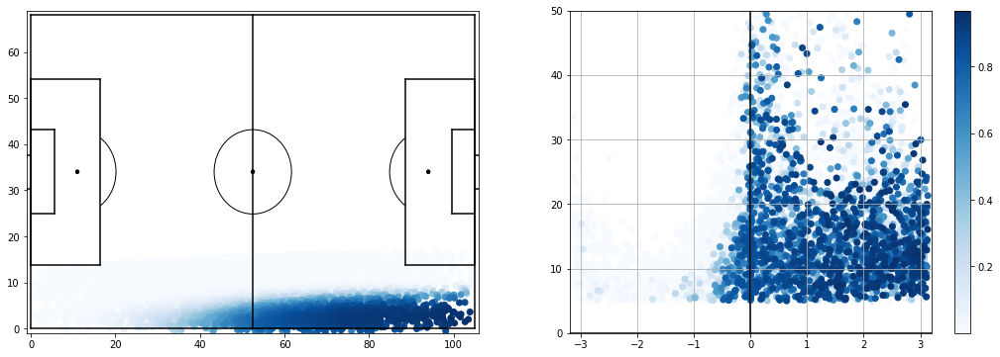

In [50]:
for column in w_i.columns:
    if "pass" in column:
        probs = w_i[column]
        pos_prob_idx = probs > 1e-10
        print(column,sum(pos_prob_idx),sum(probs))
        dfc = a.reset_index()[pos_prob_idx].copy()
        dfc["membership"] = probs[pos_prob_idx]
        dfc = dfc.sort_values("membership",ascending=True)

        axs = vis.axesxypolar()
        sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
        plt.colorbar(sc)
        #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
        axs[1].scatter(dfc.mov_angle_a0,dfc.mov_d_a0,c=dfc.membership,cmap="Blues")
        plt.show()

In [ ]:
def bic(models):
    n_data = sum(m.weights.sum() for m in models)
    n_parameters = sum(m._n_parameters() for m in models)
    L = sum(m.likelihood for m in models)
    tu = np.log(n_data) * n_parameters, np.log(n_data) * n_parameters - 2 * L
    return tu[1]

x = []
y = []
for i in tqdm.tqdm(list(range(5,100))):
    models_ll = pat.ilp_select_models_likelihood(can_i,i,verbose=False)
    x.append(i)
    y.append(bic(models_ll))

plt.plot(x,y)
plt.show()

In [ ]:
#plt.hist(np.nan_to_num((a.dy / a.dx),nan=2),bins=100)
#plt.show()
# plt.hist(a.mov_angle_a0,bins=200)
# plt.show()
b = a[:2000]
plt.scatter(b.dx,b.dy,c=b.mov_angle_a0,cmap="jet")
plt.colorbar()
plt.show()

In [51]:
cols_ii = [#"x","y",
        #"dx","dy"
        #"dist_to_goal_a0",
        #"angle_to_goal_a0",
        #"mov_d_a0",
        "mov_angle_a0"
        #"dx_a0",
        #"dy_a0"
       ]
w_i = probabilities(models_i)
can_ii = candidates(a,cols_ii,w_i,n=5)

yellow_card_0: 100%|██████████| 5/5 [00:05<00:00,  1.20s/it]


In [52]:
models_ii = pat.ilp_select_models_bic(can_ii,verbose=True)
print(len(models_ii))
list((m.name,m.n_components) for m in models_ii)

Iter	Lower Bound	Upper Bound	Gap

ECOS 2.0.7 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -3.106e+05  -3.930e+05  +8e+04  7e-03  1e-10  1e+00  8e+01    ---    ---    1  1  - |  -  - 
 1  -3.127e+05  -3.300e+05  +2e+04  1e-03  3e-11  6e+00  2e+01  0.8597  8e-02   0  1  1 |  0  0
 2  -3.160e+05  -3.186e+05  +3e+03  2e-04  5e-12  2e+00  2e+00  0.9418  1e-01   0  1  1 |  0  0
 3  -3.168e+05  -3.174e+05  +6e+02  4e-05  1e-12  4e-01  5e-01  0.9305  1e-01   0  1  1 |  0  0
 4  -3.170e+05  -3.171e+05  +6e+01  4e-06  3e-13  5e-02  5e-02  0.9163  2e-02   0  1  1 |  0  0
 5  -3.171e+05  -3.171e+05  +7e-01  4e-08  3e-14  5e-04  6e-04  0.9889  4e-04   0  1  1 |  0  0
 6  -3.171e+05  -3.171e+05  +7e-03  4e-10  7e-16  6e-06  7e-06  0.9890  1e-04   0  0  0 |  0  0
 7  -3.171e+05  -3.171e+05  +8e-05  6e-12  1e-16  7e-08  7e-08  0.9890  1e-04   1  0  0 |  0  0

OPTIMAL (wit

[('tackle_0', 1),
 ('tackle_1', 1),
 ('tackle_2', 1),
 ('tackle_3', 1),
 ('tackle_4', 1),
 ('tackle_5', 1),
 ('cross_0', 1),
 ('cross_1', 1),
 ('cross_2', 1),
 ('cross_3', 1),
 ('throw_in_0', 2),
 ('throw_in_1', 1),
 ('throw_in_2', 1),
 ('throw_in_3', 1),
 ('throw_in_4', 1),
 ('throw_in_5', 1),
 ('throw_in_6', 2),
 ('throw_in_7', 1),
 ('offside_0', 1),
 ('receival_0', 1),
 ('receival_1', 1),
 ('receival_2', 1),
 ('receival_3', 1),
 ('receival_4', 1),
 ('receival_5', 1),
 ('receival_6', 1),
 ('receival_7', 1),
 ('receival_8', 1),
 ('receival_9', 1),
 ('receival_10', 1),
 ('receival_11', 1),
 ('receival_12', 1),
 ('receival_13', 1),
 ('receival_14', 1),
 ('out_0', 1),
 ('out_1', 1),
 ('out_2', 1),
 ('out_3', 1),
 ('take_on_0', 1),
 ('take_on_1', 1),
 ('take_on_2', 1),
 ('take_on_3', 1),
 ('take_on_4', 1),
 ('bad_touch_0', 1),
 ('bad_touch_1', 1),
 ('bad_touch_2', 1),
 ('shot_0', 1),
 ('shot_1', 1),
 ('shot_2', 1),
 ('goal_0', 1),
 ('clearance_0', 1),
 ('clearance_1', 1),
 ('clearance_2',

In [ ]:
np.arctan2(0.001,0.000001)

In [ ]:
def bic(models):
    n_data = sum(m.weights.sum() for m in models)
    n_parameters = sum(m._n_parameters() for m in models)
    L = sum(m.likelihood for m in models)
    return np.log(n_data) * n_parameters , L, np.log(n_data) * n_parameters - 2 * L

x = []
y = []
e = []
ls = []
for i in tqdm.tqdm(list(range(100,200))):
    models_ll = pat.ilp_select_models_likelihood(can_ii,i,verbose=False)
    x.append(i)
    err,l, b = bic(models_ll)
    y.append(b)
    ls.append(l)
    e.append(err)
plt.plot(x,y)
plt.show()
plt.plot(x,e)
plt.show()
plt.plot(x,ls)
plt.show()

In [ ]:
#help(pd.Series)
pd.core.generic.NDFrame

In [53]:
w_ii = probabilities(models_ii)
#w_ii

tackle


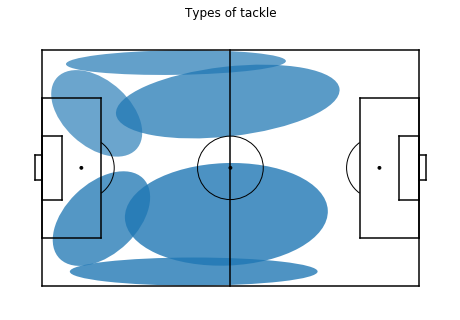

cross


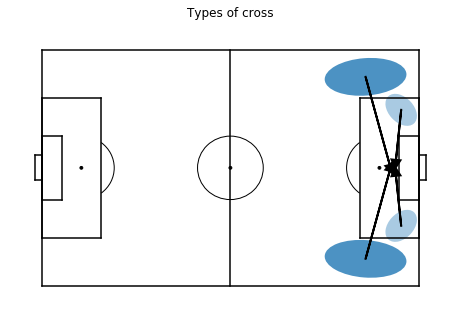

throw_in


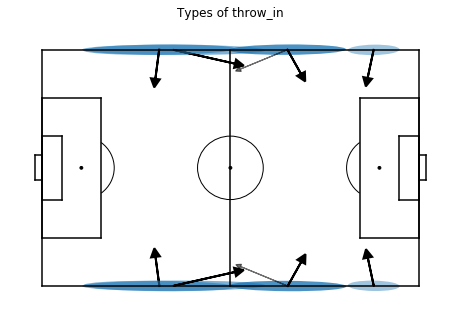

offside


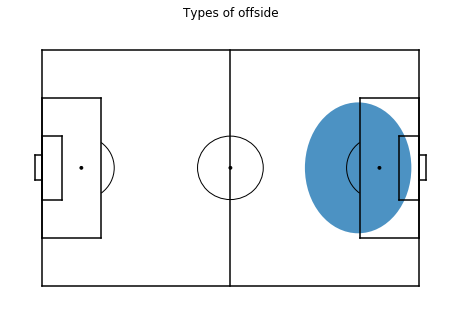

receival


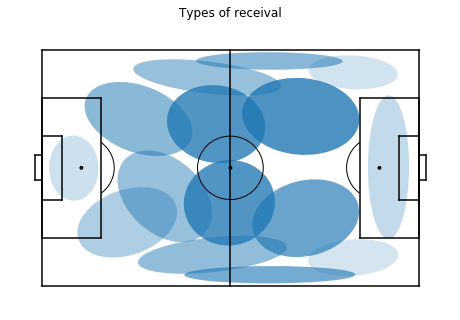

out


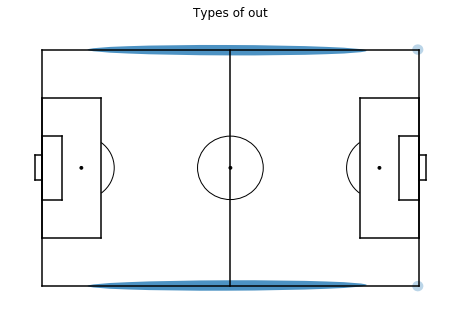

take_on


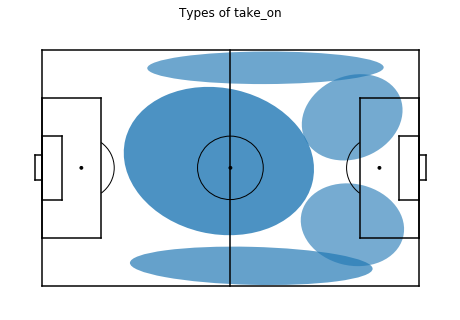

bad_touch


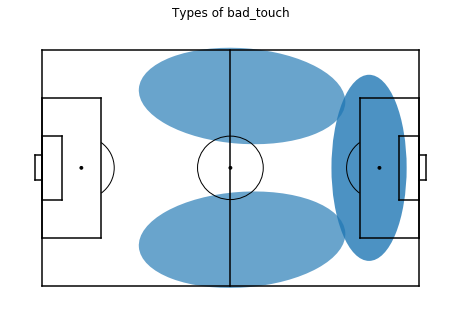

shot


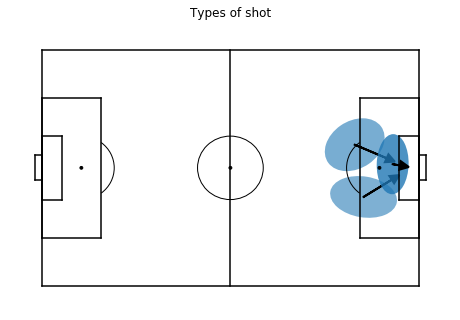

goal


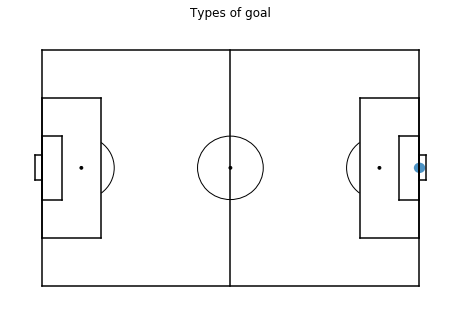

clearance


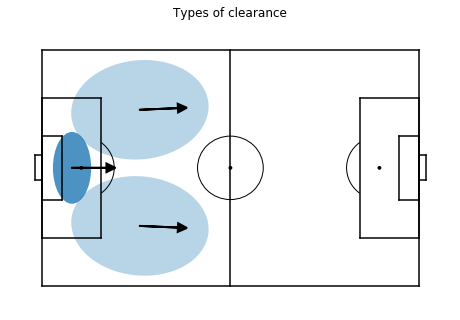

corner


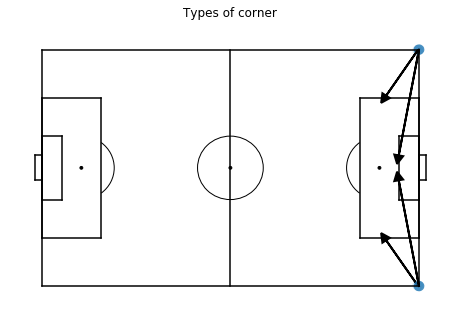

keeper_catch


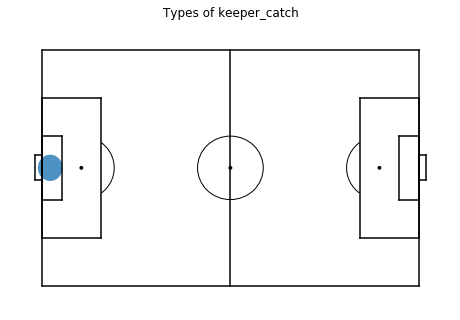

foul


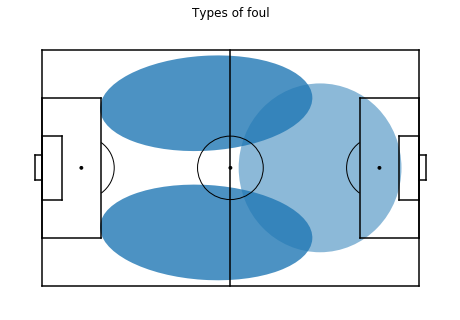

goalkick


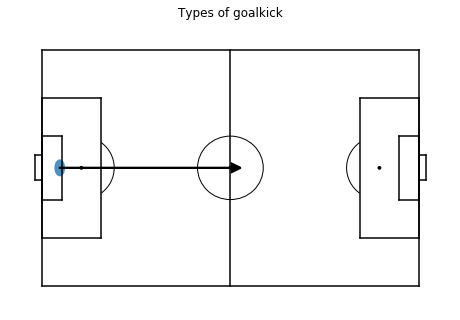

interception


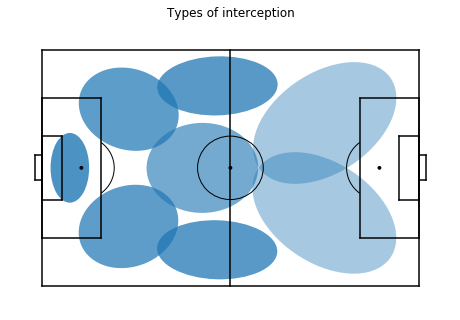

dribble


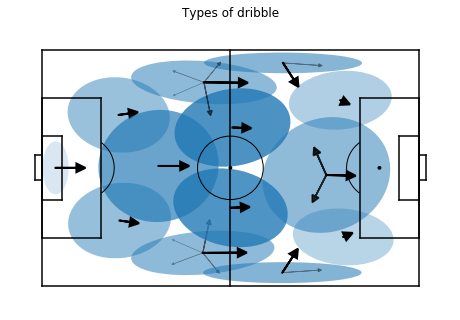

pass


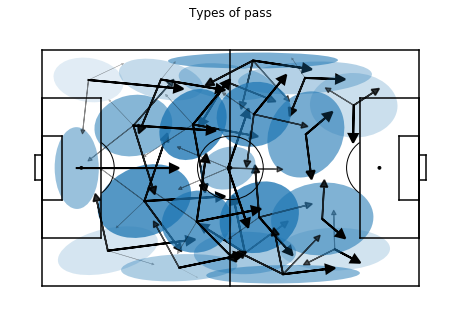

freekick


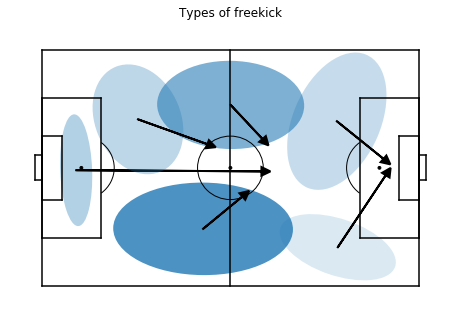

yellow_card


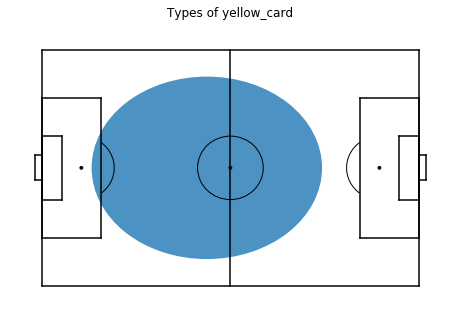

In [54]:
for m_i in models_i:
    ax = mps.field(show=False,figsize=8)
    print(m_i.name)
    strengths_i = m_i.weights_ / np.max(m_i.weights_) * 0.8
    for i,(mean,covar,strength_i) in enumerate(zip(m_i.means_, m_i.covariances_,strengths_i)):
        vis.add_ellips(ax,mean,covar[:2,:2],alpha=strength_i)
        #vis.add_ellips(ax,mean,[[covar[0],0],[0,covar[1]]],alpha=strength_i)
        x,y,a = mean
        for m_ii in models_ii:
            if f"{m_i.name}_{i}" == m_ii.name:
                strengths_ii = m_ii.weights_ / np.max(m_ii.weights_)
                for j in range(m_ii.n_components):
                    we = w_ii[f"{m_ii.name}_{j}"].values
                    #x = np.average(m_ii.df["x"].values,weights=we)
                    #y = np.average(m_ii.df["y"].values,weights=we)
                    dx = np.average(m_ii.df["dx"].values,weights=we)
                    dy = np.average(m_ii.df["dy"].values,weights=we)
                    strength_ii = strengths_ii[j]
                    d=1
                    vis.add_arrow(ax,x,y,d*dx,d*dy,
                                  alpha=strength_ii,
                                  linewidth=2*strength_ii,
                                  arrowsize=2.5*strength_ii,
                                  #linewidth=2,
                                  threshold=1)
    plt.title(f"Types of {m_i.name}")
    plt.show()

In [ ]:
import numpy as np
for prefix in w_i.columns[:10]:
    prefix_columns = list(c for c in w_ii.columns if prefix + "_" in c)
    print(prefix,len(prefix_columns))
    vis.plot_actions(a,w_ii[prefix_columns],samplefn="uni")

pass_16_1 6544


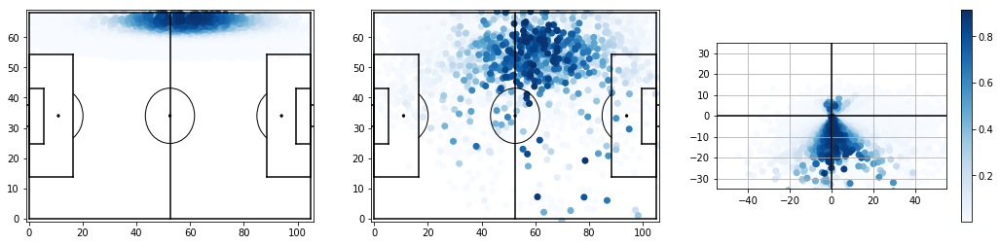

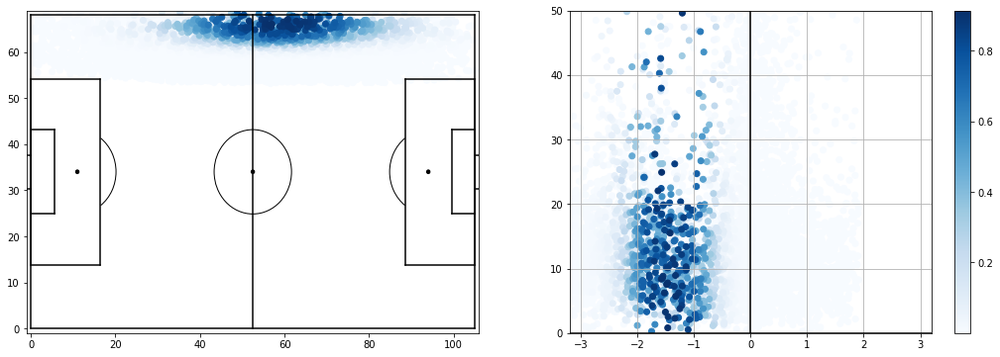

pass_16_2 3922


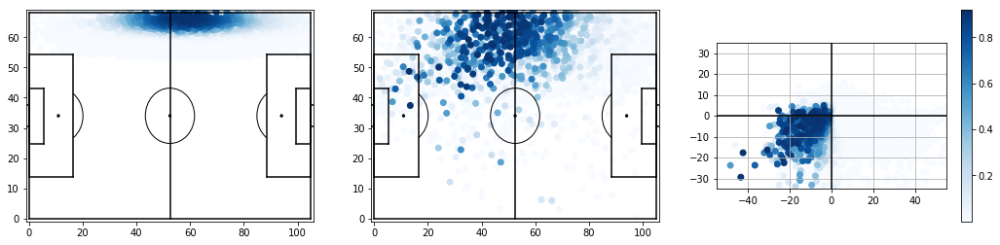

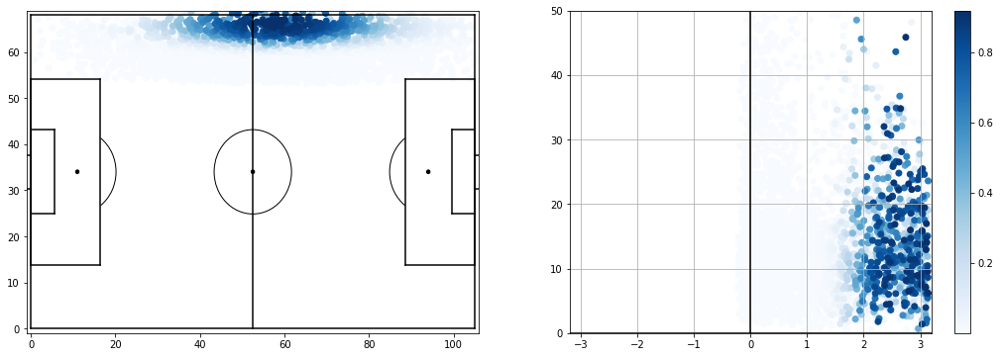

pass_16_3 3010


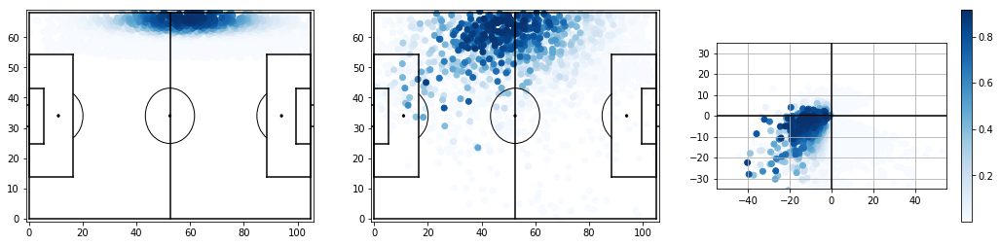

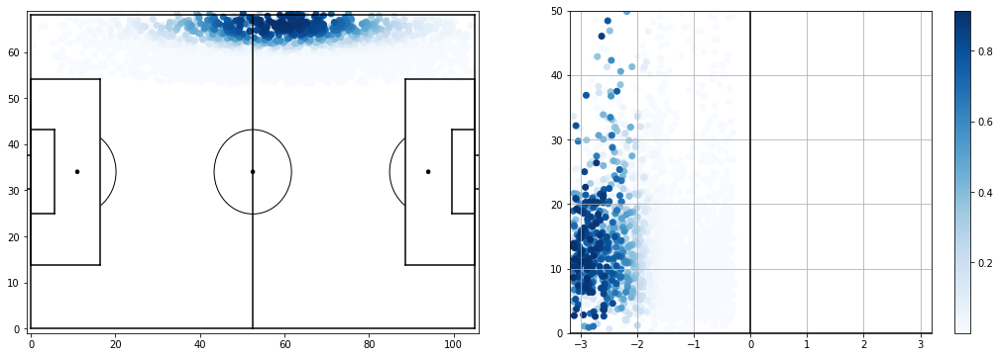

pass_16_4 6542


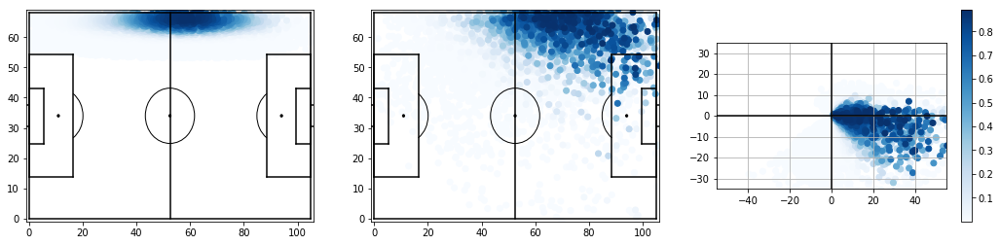

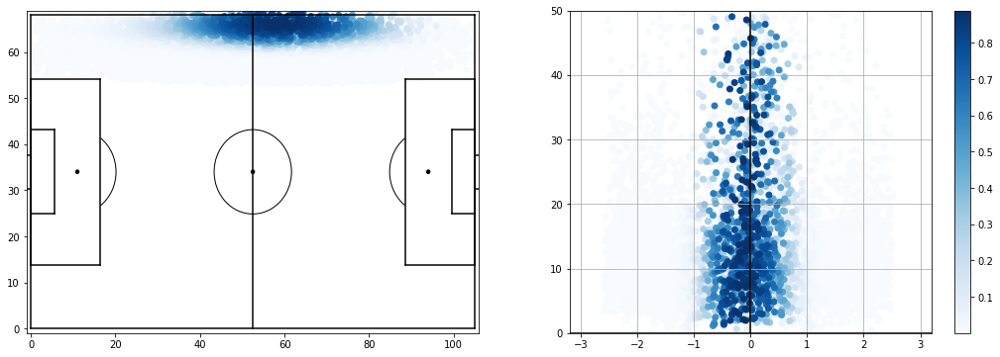

pass_17_0 12427


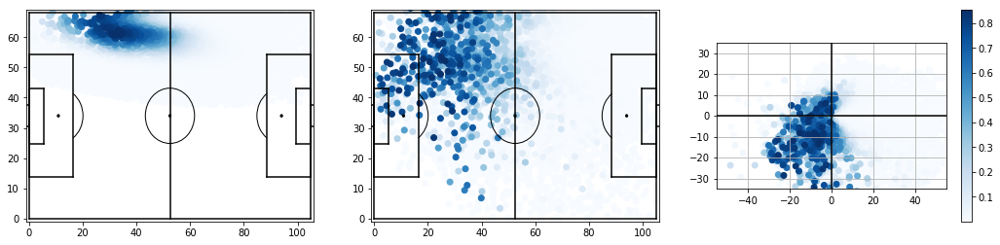

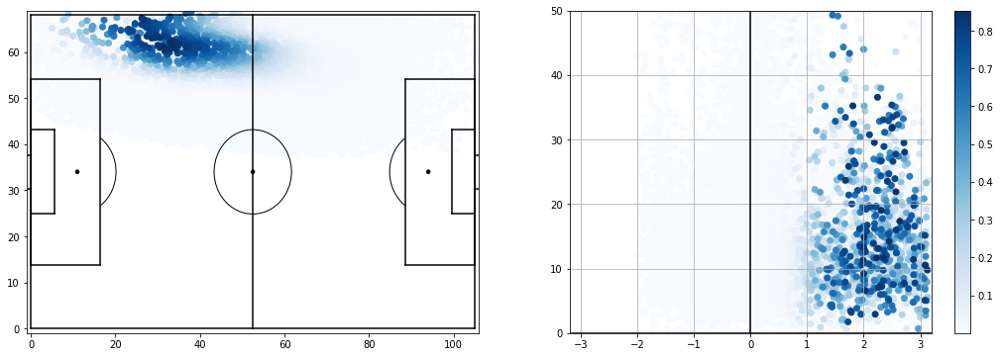

pass_17_1 12539


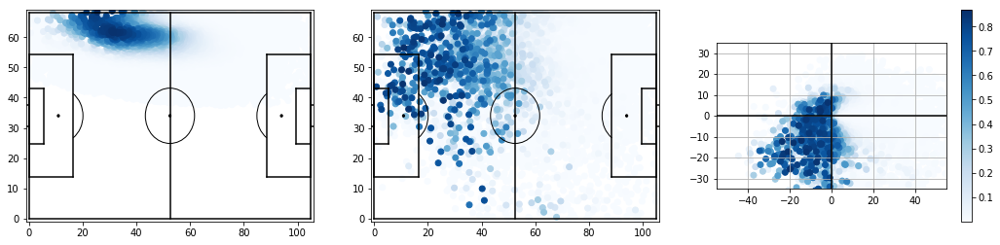

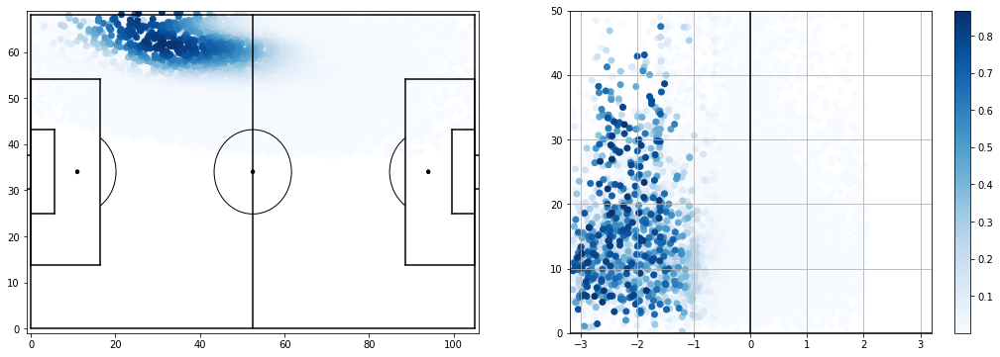

pass_17_2 16023


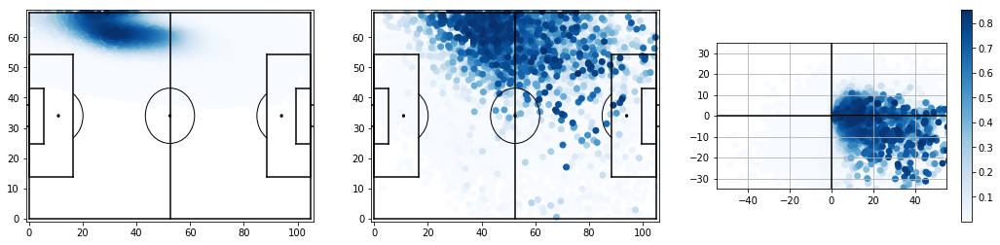

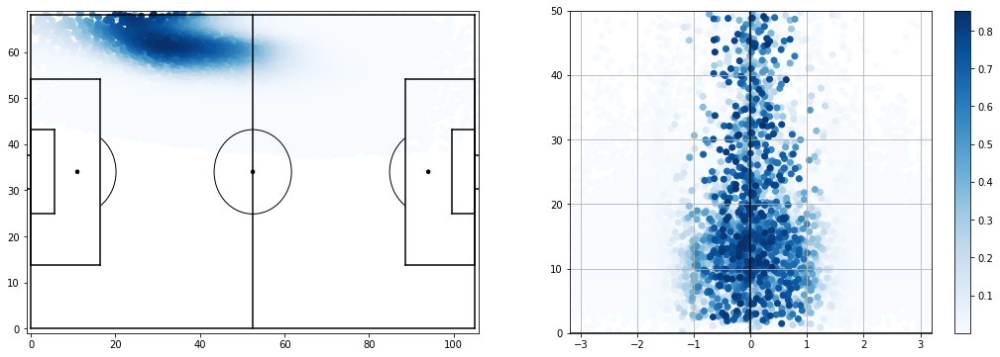

pass_18_0 12346


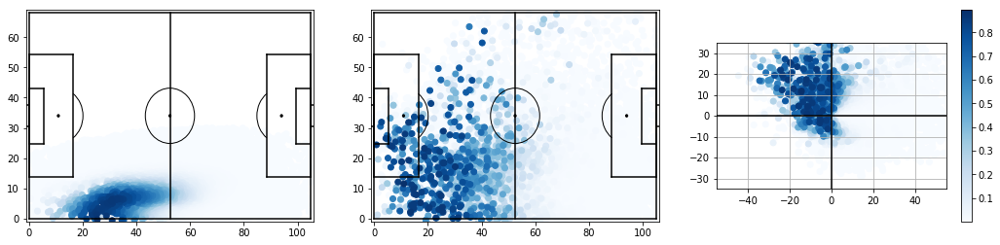

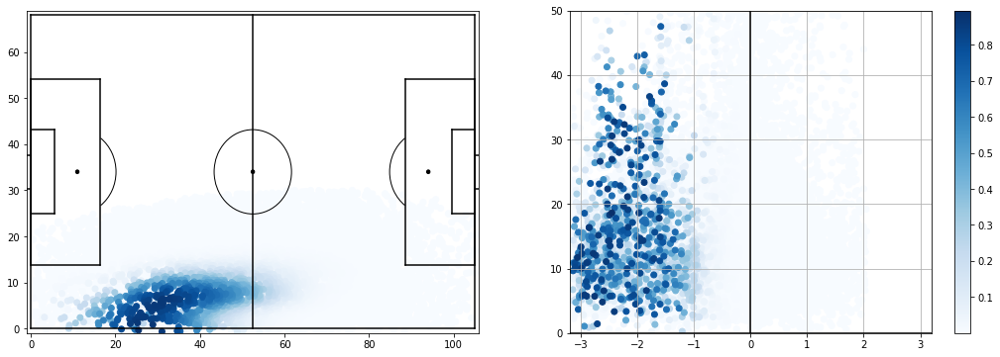

pass_18_1 12170


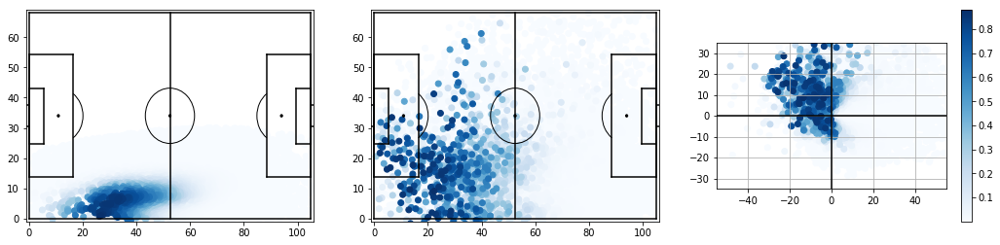

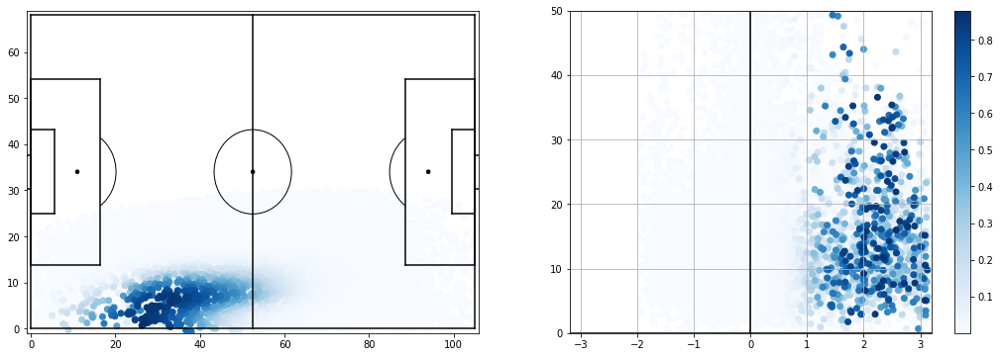

pass_18_2 15778


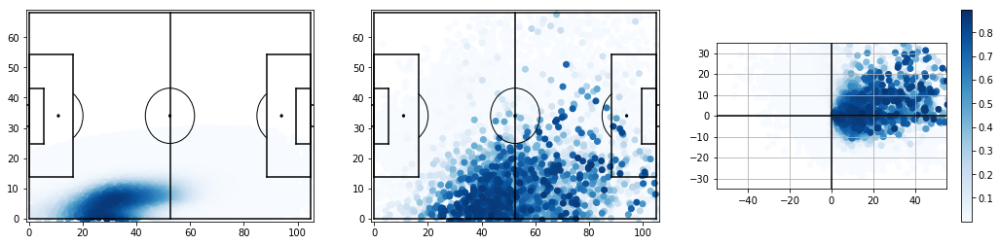

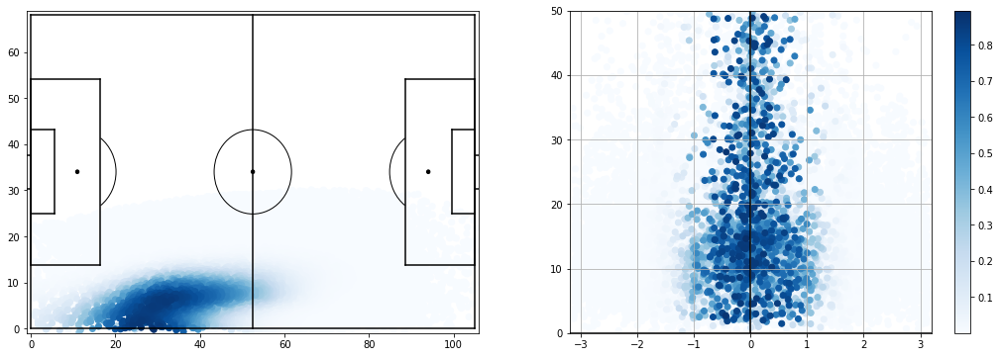

In [154]:
for column in w_ii.columns[50:60]:
    probs = w_ii[column]
    pos_prob_idx = probs > 1e-10
    print(column,sum(pos_prob_idx))
    dfc = a.reset_index()[pos_prob_idx].copy()
    dfc["membership"] = probs[pos_prob_idx]
    dfc = dfc.sort_values("membership",ascending=True)

    axs = vis.axes3()
    sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
    plt.colorbar(sc)
    axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    axs[2].scatter(dfc.dx,dfc.dy,c=dfc.membership,cmap="Blues")
    plt.show()

    axs = vis.axesxypolar()
    sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
    plt.colorbar(sc)
    #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    axs[1].scatter(dfc.mov_angle_a0,dfc.mov_d_a0,c=dfc.membership,cmap="Blues")
    #axs[1].hist(dfc.mov_angle_a0)
    
    plt.show()

In [ ]:
ucprobas = pat.uncouple_probabilities(probas,a.is_home.values)
ucprobas
ucprobas.values.sum()

In [ ]:
prev = ucprobas.values[:-1]
nex = ucprobas.values[1:]
print(prev.shape)
trans = np.dot(prev.T,nex)
plt.matshow(trans)
plt.colorbar()
plt.show()
trans /= trans.sum()
# for i in range(len(trans[0])):
#     trans[i,:] /= trans[i,:].sum()
trans.sum()
ori_trans = trans

In [ ]:
forwardtrans = trans.copy()
for i in range(len(forwardtrans[0])):
     forwardtrans[i,:] /= forwardtrans[i,:].sum()
forwardtrans.sum()

backwardtrans = trans.T.copy()
for i in range(len(backwardtrans[0])):
     backwardtrans[i,:] /= backwardtrans[i,:].sum()
backwardtrans.sum()

In [ ]:
def get_name(i):
    ty,k = gmme._global_to_local(i % gmme.total_components())
    is_opp = i > gmme.total_components() - 1
    return "_".join([ty,str(k),str(is_opp)])

In [ ]:
from sklearn.cluster import SpectralClustering

nc = 10

clustering = SpectralClustering(affinity="precomputed",n_clusters=nc).fit((sim + sim.T)/2)

for label in range(nc):
    print(label)
    ax = mps.field(show=False)
    prototypes = []
    for i in np.where(clustering.labels_ == label)[0]:
        ty,k = gmme._global_to_local(i % gmme.total_components())
        is_opp = i > gmme.total_components() - 1
        prototypes.append((ty,is_opp))
        if is_opp:
            color = "red"
        else:
            color = "blue"
        vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color=color,mirror=is_opp,show=False)
    print(Counter(prototypes))
    plt.show()

In [ ]:
sim = (np.dot(forwardtrans,backwardtrans) + np.dot(backwardtrans,forwardtrans))/2

from sklearn.cluster import KMeans

nc = 30

clus = KMeans(nc).fit(sim)

for label in range(nc):
    print(label)
    ax = mps.field(show=False)
    prototypes = []
    for i in np.where(clus.labels_ == label)[0]:
        ty,k = gmme._global_to_local(i % gmme.total_components())
        is_opp = i > gmme.total_components() - 1
        prototypes.append((ty,is_opp))
        if is_opp:
            color = "red"
        else:
            color = "blue"
        vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color=color,mirror=is_opp,show=False)
    print(Counter(prototypes))
    plt.show()

In [ ]:
from collections import Counter

sim = (np.dot(forwardtrans,backwardtrans) + np.dot(backwardtrans,forwardtrans))/2

plt.matshow(sim)
plt.colorbar()
plt.show()

from sklearn.cluster import AgglomerativeClustering
nc = 50
clustering = AgglomerativeClustering(affinity="euclidean",linkage="average",n_clusters=nc).fit(sim.T)

for label in range(nc):
    print(label)
    ax = mps.field(show=False)
    prototypes = []
    for i in np.where(clustering.labels_ == label)[0]:
        ty,k = gmme._global_to_local(i % gmme.total_components())
        is_opp = i > gmme.total_components() - 1
        prototypes.append((ty,is_opp))
        if is_opp:
            color = "red"
        else:
            color = "blue"
        vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color=color,mirror=is_opp,show=False)
    print(Counter(prototypes))
    plt.show()

In [ ]:
i = 170
ty,k = gmme._global_to_local(i % gmme.total_components())
is_opp = i > gmme.total_components() - 1
print(ty,k,is_opp)
vis.plot_component_w_arrow(gmme.models[ty],k,color="red",mirror=is_opp)

oldty,oldk,oldopp = ty,k,is_opp

v = np.zeros(gmme.total_components()*2)
v[i] = 1

forv = np.dot(np.dot(v,forwardtrans),backwardtrans)
plt.plot(forv)
plt.show()

backv = np.dot(np.dot(v,backwardtrans),forwardtrans)
plt.plot(backv)
plt.show()

newv = (forv + backv)/2
plt.plot(newv)
plt.show()

for j in np.argsort(newv)[::-1][:4]:
    ty,k = gmme._global_to_local(j % gmme.total_components())
    is_opp = j > gmme.total_components() - 1
    print(ty,k,is_opp)
    ax = vis.plot_component_w_arrow(gmme.models[oldty],oldk,color="red",mirror=oldopp,show=False)
    vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color="blue",mirror=is_opp)

In [ ]:
trans1 = ori_trans.copy()
for _i in range(10):
    print(trans1.sum())
    trans1 = np.dot(ori_trans.T,trans1)
    trans1 /= trans1.sum()

In [ ]:
delta_trans = trans1 - ori_trans
plt.matshow(delta_trans)
plt.colorbar()
plt.show
delta_trans.max(), delta_trans.min()

In [ ]:
trans = delta_trans
trans = trans1

In [ ]:
trans.sum()

In [ ]:
plt.hist([p for p,i,j in probs])
plt.show()

In [ ]:
probs = []
for i in range(len(trans)):
    for j in range(len(trans)):
        probs.append((trans[i,j],i,j))
probs = sorted(probs,reverse=True)
movs = [(p,i,j) for p,i,j in probs]# if i != j]

cols = list(ucprobas.columns)

def test(i,j):
    return True
    return "goal1" in cols[j]# and "opp" not in cols[j]
    return "shot" in cols[i] and "opp" not in cols[j]

interestmovs = [(p,i,j) for p,i,j in movs 
                if test(i,j)
                #"pass" not in cols[i]
                   # and "receival" not in cols[i]
                   # and "dribble" not in cols[i]
               ]

for p,i,j in interestmovs[:10]:
    print(p,i,j)
    print(cols[i],"(red)","->",cols[j],"(blue)")
    ax = mps.field(show=False)
    ty,k = gmme._global_to_local(i % gmme.total_components())
    is_opp = i > gmme.total_components() - 1
    vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color="red",mirror=is_opp,show=False)
    ty,k = gmme._global_to_local(j % gmme.total_components())
    is_opp = j > gmme.total_components() - 1
    vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color="blue",mirror=is_opp,show=False)
    plt.show()

In [ ]:
labels = np.argmax(probas.values,axis=1)

for p,i,j in movs[:10000]:
    cols = gmme._columns()
    if "shot" in cols[j] and "kick" not in cols[j]:# or True:
        print(p,i,j)
        print(cols[i],"(blue)","->",cols[j],"(red)")
        l_idx = (labels == i) | (labels == j)
        twocolors = ["blue" if l == i else "red" for l in labels[l_idx]]
        axs = vis.locmovaxes()
        axs[0].scatter(a.x[l_idx],a.y[l_idx],color=twocolors)
        axs[1].scatter(a.dx[l_idx],a.dy[l_idx],color=twocolors)
        plt.show()
    if p < 50:
        break

In [ ]:
labels = np.argmax(probas.values,axis=1)

for p,i,j in movs[:10000]:
    cols = gmme._columns()
    if "shot" in cols[j] and "kick" not in cols[j]:# or True:
        print(p,i,j)
        print(cols[i],"(blue)","->",cols[j],"(red)")
        l_idx = (labels == i) | (labels == j)
        twocolors = ["blue" if l == i else "red" for l in labels[l_idx]]
        axs = vis.locmovaxes()
        axs[0].scatter(a.x[l_idx],a.y[l_idx],color=twocolors)
        axs[1].scatter(a.dx[l_idx],a.dy[l_idx],color=twocolors)
        plt.show()
    if p < 5:
        break